**Chapter 18 – Reinforcement Learning**

_This notebook contains all the sample code and solutions to the exercises in chapter 18._

<table align="left">
  <td>
    <a href="https://colab.research.google.com/github/ageron/handson-ml3/blob/main/18_reinforcement_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>
  </td>
  <td>
    <a target="_blank" href="https://kaggle.com/kernels/welcome?src=https://github.com/ageron/handson-ml3/blob/main/18_reinforcement_learning.ipynb"><img src="https://kaggle.com/static/images/open-in-kaggle.svg" /></a>
  </td>
</table>

# Setup

This project requires Python 3.7 or above:

In [2]:
import sys

assert sys.version_info >= (3, 7)

**Warning**: the latest TensorFlow versions are based on Keras 3. For chapters 10-15, it wasn't too hard to update the code to support Keras 3, but unfortunately it's much harder for this chapter, in particular adding custom losses using the functional API is not implemented yet. So for this chapter I've had to revert to Keras 2. To do that, I set the `TF_USE_LEGACY_KERAS` environment variable to `"1"` and import the `tf_keras` package. This ensures that `tf.keras` points to `tf_keras`, which is Keras 2.*.

In [8]:
!pip uninstall tensorflow tensorflow-gpu -y

In [15]:
!pip install "tensorflow[and-cuda]"
!pip install keras  # Needed for compatibility with TensorFlow 2.8 and Keras 2.*
!pip install numpy matplotlib
!pip install packaging
!pip install gymnasium[all]  # Replaces OpenAI Gym; includes 'classic_control', 'box2d', 'atari', etc.
!pip install swig  # Needed for Box2D environments

  Using cached tensorflow-2.18.0-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (615.3 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.5 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.5/22.5 MB 8.5 MB/s eta 0:00:0000:0100:01m
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.3/130.3 MB 7.3 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 895.7/895.7 kB 35.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.9/24.9 MB 11.5 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.3/363.3 MB 3.2 MB/s eta 0:00:0000:0100:02
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 192.5/192.5 MB 4.9 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 577.2/577.2 MB 2.8 MB/s eta 0:00:0000:0100:03
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 18.2 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 217.6/217.6 MB 4.2 MB/s eta 0:00:0000:0100:01

In [10]:
!pip uninstall protobuf numpy matplotlib contourpy -y

Found existing installation: protobuf 5.29.3
Uninstalling protobuf-5.29.3:
  Successfully uninstalled protobuf-5.29.3
Found existing installation: numpy 1.26.0
Uninstalling numpy-1.26.0:
  Successfully uninstalled numpy-1.26.0
Found existing installation: matplotlib 3.9.4
Uninstalling matplotlib-3.9.4:
  Successfully uninstalled matplotlib-3.9.4
Found existing installation: contourpy 1.3.0
Uninstalling contourpy-1.3.0:
  Successfully uninstalled contourpy-1.3.0


In [11]:
!pip install protobuf
!pip install numpy==1.26.0
!pip install matplotlib contourpy

  Using cached protobuf-5.29.3-cp38-abi3-manylinux2014_x86_64.whl (319 kB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorboard 2.18.0 requires numpy>=1.12.0, which is not installed.
proto-plus 1.23.0 requires protobuf<5.0.0dev,>=3.19.0, but you have protobuf 5.29.3 which is incompatible.
googleapis-common-protos 1.63.0 requires protobuf!=3.20.0,!=3.20.1,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0.dev0,>=3.19.5, but you have protobuf 5.29.3 which is incompatible.
google-api-core 2.18.0 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0.dev0,>=3.19.5, but you have protobuf 5.29.3 which is incompatible.
  Using cached numpy-1.26.0-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.2 MB)
  Using cached matplotlib-3.9.4-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (8.3 MB)
  Using cac

In [18]:
# Verify GPU availability
import tensorflow as tf

print("TensorFlow Version:", tf.__version__)
if tf.test.gpu_device_name():
    print("GPU Available:", tf.test.gpu_device_name())
else:
    print("GPU not detected. Ensure CUDA and cuDNN are installed.")

2025-01-25 07:52:19.965795: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-01-25 07:52:19.984686: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1737791540.007908 2586562 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1737791540.014824 2586562 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-25 07:52:20.039204: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

TensorFlow Version: 2.18.0
GPU Available: /device:GPU:0


I0000 00:00:1737791541.983979 2586562 gpu_device.cc:2022] Created device /device:GPU:0 with 79078 MB memory:  -> device: 0, name: NVIDIA A100 80GB PCIe, pci bus id: 0000:31:00.0, compute capability: 8.0
I0000 00:00:1737791541.986868 2586562 gpu_device.cc:2022] Created device /device:GPU:1 with 79078 MB memory:  -> device: 1, name: NVIDIA A100 80GB PCIe, pci bus id: 0000:4b:00.0, compute capability: 8.0
I0000 00:00:1737791541.988229 2586562 gpu_device.cc:2022] Created device /device:GPU:2 with 79078 MB memory:  -> device: 2, name: NVIDIA A100 80GB PCIe, pci bus id: 0000:ca:00.0, compute capability: 8.0
I0000 00:00:1737791542.008318 2586562 gpu_device.cc:2022] Created device /device:GPU:0 with 79078 MB memory:  -> device: 0, name: NVIDIA A100 80GB PCIe, pci bus id: 0000:31:00.0, compute capability: 8.0
I0000 00:00:1737791542.009400 2586562 gpu_device.cc:2022] Created device /device:GPU:1 with 79078 MB memory:  -> device: 1, name: NVIDIA A100 80GB PCIe, pci bus id: 0000:4b:00.0, compute c

In [7]:
!nvcc --version
%cat /usr/local/cuda/include/cudnn_version.h | grep CUDNN_MAJOR -A 2

zsh:1: command not found: nvcc


cat: /usr/local/cuda/include/cudnn_version.h: No such file or directory


In [8]:
# import tensorflow as tf
# import time

# with tf.device('/GPU:0'):
#     start = time.time()
#     matrix = tf.random.uniform((10000, 10000))
#     result = tf.matmul(matrix, matrix)
#     print("Computation complete in:", time.time() - start, "seconds")

In [3]:
import os
os.environ["TF_USE_LEGACY_KERAS"] = "1" 

from tensorflow import keras


2025-01-25 07:54:19.708897: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-01-25 07:54:19.729739: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1737791659.753334 2591228 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1737791659.760383 2591228 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-25 07:54:19.785277: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

And TensorFlow ≥ 2.8:

In [4]:
from packaging import version
import tensorflow as tf

assert version.parse(tf.__version__) >= version.parse("2.8.0")

As we did in earlier chapters, let's define the default font sizes to make the figures prettier. We will also display some Matplotlib animations, and there are several possible options to do that: we will use the Javascript option.

In [5]:
import matplotlib.animation
import matplotlib.pyplot as plt

plt.rc('font', size=14)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.rc('animation', html='jshtml')

And let's create the `images/rl` folder (if it doesn't already exist), and define the `save_fig()` function which is used through this notebook to save the figures in high-res for the book:

In [20]:
from pathlib import Path

IMAGES_PATH = Path() / "images" / "rl"
IMAGES_PATH.mkdir(parents=True, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = IMAGES_PATH / f"{fig_id}.{fig_extension}"
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

This chapter can be very slow without a GPU, so let's make sure there's one, or else issue a warning:

In [21]:
if not tf.config.list_physical_devices('GPU'):
    print("No GPU was detected. Neural nets can be very slow without a GPU.")
    if "google.colab" in sys.modules:
        print("Go to Runtime > Change runtime and select a GPU hardware "
              "accelerator.")
    if "kaggle_secrets" in sys.modules:
        print("Go to Settings > Accelerator and select GPU.")

Let's install the Gymnasium library, which provides many environments for Reinforcement Learning. We'll also install the extra libraries needed for classic control environments (including CartPole, which we will use shortly), as well as for Box2D and Atari environments, which are needed for the exercises.

**Important notes:**
* OpenAI has handed over the maintenance and developmnent of the Gym library to the Farama foundation (see the [announcement](https://farama.org/Announcing-The-Farama-Foundation)), and the library was renamed to Gymnasium. It's a drop-in replacement for OpenAI Gym: you can just install `gymnasium` instead of `gym`, and `import gymnasium as gym`, and everything should work fine.
* by running the following cell, you accept the Atari ROM license.

In [22]:
if "google.colab" in sys.modules or "kaggle_secrets" in sys.modules:
    %pip install -q -U gymnasium swig
    %pip install -q -U gymnasium[classic_control,box2d,atari,accept-rom-license]

In [23]:
!pip install -q -U gymnasium swig
!pip install -q -U "gymnasium[classic_control,box2d,atari,accept-rom-license]"


# Introduction to ~OpenAI gym~ Gymnasium

In this notebook we will be using [gymnasium](https://github.com/Farama-Foundation/Gymnasium), a great toolkit for developing and comparing Reinforcement Learning algorithms. It provides many environments for your learning *agents* to interact with. Let's import Gym and make a new CartPole environment:

In [6]:
import gymnasium as gym

env = gym.make("CartPole-v1", render_mode="rgb_array")

The CartPole (version 1) is a very simple environment composed of a cart that can move left or right, and pole placed vertically on top of it. The agent must move the cart left or right to keep the pole upright.

**Tip**: `gym.envs.registry` is a dictionary containing all available environments:

In [7]:
# extra code – shows the first few environments
envs = gym.envs.registry
sorted(envs.keys())[:5] + ["..."]

['Acrobot-v1', 'Ant-v2', 'Ant-v3', 'Ant-v4', 'Ant-v5', '...']

The registry values are environment specifications:

In [8]:
# extra code – shows the specification for the CartPole-v1 environment
envs["CartPole-v1"]

EnvSpec(id='CartPole-v1', entry_point='gymnasium.envs.classic_control.cartpole:CartPoleEnv', reward_threshold=475.0, nondeterministic=False, max_episode_steps=500, order_enforce=True, disable_env_checker=False, kwargs={}, namespace=None, name='CartPole', version=1, additional_wrappers=(), vector_entry_point='gymnasium.envs.classic_control.cartpole:CartPoleVectorEnv')

Let's initialize the environment by calling is `reset()` method. This returns an observation, as well as a dictionary that may contain extra information. Both are environment-specific.

In [9]:
obs, info = env.reset(seed=42)
obs

array([ 0.0273956 , -0.00611216,  0.03585979,  0.0197368 ], dtype=float32)

In [10]:
info

{}

In the case of the CartPole, each observation is a 1D NumPy array composed of 4 floats: they represent the cart's horizontal position, its velocity, the angle of the pole (0 = vertical), and the angular velocity.

An environment can be visualized by calling its `render()` method. If you set `render_mode` to `"rgb_array"` when creating the environment, then this will return a NumPy array.

In [11]:
img = env.render()
img.shape  # height, width, channels (3 = Red, Green, Blue)

(400, 600, 3)

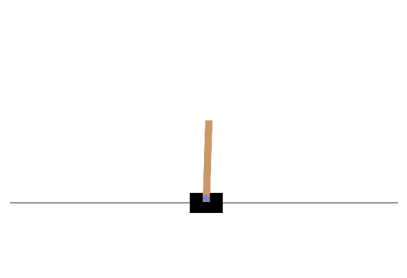

In [12]:
# extra code – creates a little function to render and plot an environment

def plot_environment(env, figsize=(5, 4)):
    plt.figure(figsize=figsize)
    img = env.render()
    plt.imshow(img)
    plt.axis("off")
    return img

plot_environment(env)
plt.show()

Let's see how to interact with an environment. Your agent will need to select an action from an "action space" (the set of possible actions). Let's see what this environment's action space looks like:

In [13]:
env.action_space

Discrete(2)

Yep, just two possible actions: accelerate towards the left (0) or towards the right (1).

Since the pole is leaning toward the right (`obs[2] > 0`), let's accelerate the cart toward the right:

In [14]:
action = 1  # accelerate right
obs, reward, done, truncated, info = env.step(action)
obs

array([ 0.02727336,  0.18847767,  0.03625453, -0.26141977], dtype=float32)

Notice that the cart is now moving toward the right (`obs[1] > 0`). The pole is still tilted toward the right (`obs[2] > 0`), but its angular velocity is now negative (`obs[3] < 0`), so it will likely be tilted toward the left after the next step.

NameError: name 'save_fig' is not defined

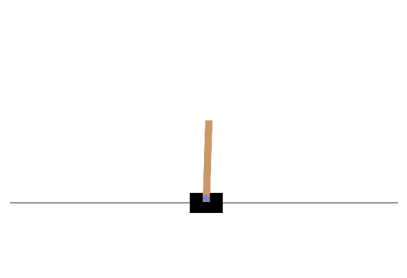

In [15]:
# extra code – displays the environment
plot_environment(env)
save_fig("cart_pole_plot")
plt.show()

Looks like it's doing what we're telling it to do!

The environment also tells the agent how much reward it got during the last step:

In [34]:
reward

1.0

When the game is over, the environment returns `done=True`. In this case, it's not over yet:

In [35]:
done

False

Some environment wrappers may want to interrupt the environment early. For example, when a time limit is reached or when an object goes out of bounds. In this case, `truncated` will be set to `True`. In this case, it's not truncated yet:

In [36]:
truncated

False

Finally, `info` is an environment-specific dictionary that can provide some extra information that you may find useful for debugging or for training. For example, in some games it may indicate how many lives the agent has.

In [37]:
info

{}

The sequence of steps between the moment the environment is reset until it is done or truncated is called an "episode". At the end of an episode (i.e., when `step()` returns `done=True` or `truncated=True`), you should reset the environment before you continue to use it.

In [38]:
if done or truncated:
    obs, info = env.reset()

Now how can we make the poll remain upright? We will need to define a _policy_ for that. This is the strategy that the agent will use to select an action at each step. It can use all the past actions and observations to decide what to do.

# A simple hard-coded policy

Let's hard code a simple strategy: if the pole is tilting to the left, then push the cart to the left, and _vice versa_. Let's see if that works:

In [16]:
def basic_policy(obs):
    angle = obs[2]
    return 0 if angle < 0 else 1

totals = []
for episode in range(500):
    episode_rewards = 0
    obs, info = env.reset(seed=episode)
    for step in range(200):
        action = basic_policy(obs)
        obs, reward, done, truncated, info = env.step(action)
        episode_rewards += reward
        if done or truncated:
            break

    totals.append(episode_rewards)

In [17]:
import numpy as np

np.mean(totals), np.std(totals), min(totals), max(totals)

(41.698, 8.389445512070509, 24.0, 63.0)

Well, as expected, this strategy is a bit too basic: the best it did was to keep the poll up for only 63 steps. This environment is considered solved when the agent keeps the poll up for 200 steps.

Let's visualize one episode. You can learn more about Matplotlib animations in the [Matplotlib tutorial notebook](tools_matplotlib.ipynb#Animations).

In [18]:
# extra code – this cell displays an animation of one episode

def update_scene(num, frames, patch):
    patch.set_data(frames[num])
    return patch,

def plot_animation(frames, repeat=False, interval=40):
    fig = plt.figure()
    patch = plt.imshow(frames[0])
    plt.axis('off')
    anim = matplotlib.animation.FuncAnimation(
        fig, update_scene, fargs=(frames, patch),
        frames=len(frames), repeat=repeat, interval=interval)
    plt.close()
    return anim

def show_one_episode(policy, n_max_steps=200, seed=42):
    frames = []
    env = gym.make("CartPole-v1", render_mode="rgb_array")
    np.random.seed(seed)
    obs, info = env.reset(seed=seed)
    for step in range(n_max_steps):
        frames.append(env.render())
        action = policy(obs)
        obs, reward, done, truncated, info = env.step(action)
        if done or truncated:
            break
    env.close()
    return plot_animation(frames)

show_one_episode(basic_policy)

Clearly the system is unstable and after just a few wobbles, the pole ends up too tilted: game over. We will need to be smarter than that!

# Neural Network Policies

Let's create a neural network that will take observations as inputs, and output the probabilities of actions to take for each observation. To choose an action, the network will estimate a probability for each action, then we will select an action randomly according to the estimated probabilities. In the case of the CartPole environment, there are just two possible actions (left or right), so we only need one output neuron: it will output the probability `p` of the action 0 (left), and of course the probability of action 1 (right) will be `1 - p`.

In [42]:
!export TF_ENABLE_ONEDNN_OPTS=0

In [43]:
!nvcc --version
!cat /usr/include/cudnn_version.h | grep CUDNN_MAJOR -A 2

zsh:1: command not found: nvcc
#define CUDNN_MAJOR 8
#define CUDNN_MINOR 9
#define CUDNN_PATCHLEVEL 7
--
#define CUDNN_VERSION (CUDNN_MAJOR * 1000 + CUDNN_MINOR * 100 + CUDNN_PATCHLEVEL)

/* cannot use constexpr here since this is a C-only file */


In [44]:
import os
os.environ.pop("TF_USE_LEGACY_KERAS", None)


'1'

In [45]:
import tensorflow as tf

print("TensorFlow version:", tf.__version__)
print("Available GPUs:", tf.config.list_physical_devices('GPU'))


TensorFlow version: 2.18.0
Available GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:2', device_type='GPU')]


In [46]:
import tensorflow as tf

tf.random.set_seed(42)

model = tf.keras.Sequential([
    tf.keras.layers.Dense(5, activation="relu"),
    tf.keras.layers.Dense(1, activation="sigmoid"),
])

print("Model built successfully!")


Model built successfully!


In this particular environment, the past actions and observations can safely be ignored, since each observation contains the environment's full state. If there were some hidden state then you may need to consider past actions and observations in order to try to infer the hidden state of the environment. For example, if the environment only revealed the position of the cart but not its velocity, you would have to consider not only the current observation but also the previous observation in order to estimate the current velocity. Another example is if the observations are noisy: you may want to use the past few observations to estimate the most likely current state. Our problem is thus as simple as can be: the current observation is noise-free and contains the environment's full state.

You may wonder why we plan to pick a random action based on the probability given by the policy network, rather than just picking the action with the highest probability. This approach lets the agent find the right balance between _exploring_ new actions and _exploiting_ the actions that are known to work well. Here's an analogy: suppose you go to a restaurant for the first time, and all the dishes look equally appealing so you randomly pick one. If it turns out to be good, you can increase the probability to order it next time, but you shouldn't increase that probability to 100%, or else you will never try out the other dishes, some of which may be even better than the one you tried.

Let's write a small policy function that will use the neural net to get the probability of moving left, then let's use it to run one episode:

In [47]:
!sudo cp cuda/include/* /usr/local/cuda/include/
!sudo cp cuda/lib64/* /usr/local/cuda/lib64/

zsh:1: no matches found: cuda/include/*


zsh:1: no matches found: cuda/lib64/*


In [48]:
!cat /usr/local/cuda/include/cudnn_version.h | grep CUDNN_MAJOR -A 2

cat: /usr/local/cuda/include/cudnn_version.h: No such file or directory


In [49]:
import tensorflow as tf

print("Available GPUs:", tf.config.list_physical_devices('GPU'))

Available GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:2', device_type='GPU')]


In [20]:
# extra code – a function that creates an animation for a given policy model

def pg_policy(obs):
    left_proba = model.predict(obs[np.newaxis], verbose=0)[0][0]
    return int(np.random.rand() > left_proba)

np.random.seed(42)
show_one_episode(pg_policy)

I0000 00:00:1737776747.866974 2354142 service.cc:148] XLA service 0x7f1d372e1bb0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1737776747.867067 2354142 service.cc:156]   StreamExecutor device (0): NVIDIA A100 80GB PCIe, Compute Capability 8.0
I0000 00:00:1737776747.867073 2354142 service.cc:156]   StreamExecutor device (1): NVIDIA A100 80GB PCIe, Compute Capability 8.0
I0000 00:00:1737776747.867077 2354142 service.cc:156]   StreamExecutor device (2): NVIDIA A100 80GB PCIe, Compute Capability 8.0
I0000 00:00:1737776747.886844 2354142 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-01-25 03:45:47.936422: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:930] The NVIDIA driver's CUDA version is 12.4 which is older than the PTX compiler version 12.5.82. Because the driver is older than the PTX compiler version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the 

Yeah... pretty bad. The neural network will have to learn to do better. First let's see if it is capable of learning the basic policy we used earlier: go left if the pole is tilting left, and go right if it is tilting right.

Let's see if it can learn a better policy on its own. One that does not wobble as much.

# Policy Gradients

To train this neural network we will need to define the target probabilities **y**. If an action is good we should increase its probability, and conversely if it is bad we should reduce it. But how do we know whether an action is good or bad? The problem is that most actions have delayed effects, so when you win or lose points in an episode, it is not clear which actions contributed to this result: was it just the last action? Or the last 10? Or just one action 50 steps earlier? This is called the _credit assignment problem_.

The _Policy Gradients_ algorithm tackles this problem by first playing multiple episodes, then making the actions near positive rewards slightly more likely, while actions near negative rewards are made slightly less likely. First we play, then we go back and think about what we did.

Let's start by creating a function to play a single step using the model. We will also pretend for now that whatever action it takes is the right one, so we can compute the loss and its gradients. We will just save these gradients for now, and modify them later depending on how good or bad the action turned out to be.

In [51]:
def play_one_step(env, obs, model, loss_fn):
    with tf.GradientTape() as tape:
        left_proba = model(obs[np.newaxis])
        action = (tf.random.uniform([1, 1]) > left_proba)
        y_target = tf.constant([[1.]]) - tf.cast(action, tf.float32)
        loss = tf.reduce_mean(loss_fn(y_target, left_proba))

    grads = tape.gradient(loss, model.trainable_variables)
    obs, reward, done, truncated, info = env.step(int(action))
    return obs, reward, done, truncated, grads

If `left_proba` is high, then `action` will most likely be `False` (since a random number uniformally sampled between 0 and 1 will probably not be greater than `left_proba`). And `False` means 0 when you cast it to a number, so `y_target` would be equal to 1 - 0 = 1. In other words, we set the target to 1, meaning we pretend that the probability of going left should have been 100% (so we took the right action).

Now let's create another function that will rely on the `play_one_step()` function to play multiple episodes, returning all the rewards and gradients, for each episode and each step:

In [52]:
def play_multiple_episodes(env, n_episodes, n_max_steps, model, loss_fn):
    all_rewards = []
    all_grads = []
    for episode in range(n_episodes):
        current_rewards = []
        current_grads = []
        obs, info = env.reset()
        for step in range(n_max_steps):
            obs, reward, done, truncated, grads = play_one_step(
                env, obs, model, loss_fn)
            current_rewards.append(reward)
            current_grads.append(grads)
            if done or truncated:
                break

        all_rewards.append(current_rewards)
        all_grads.append(current_grads)

    return all_rewards, all_grads

The Policy Gradients algorithm uses the model to play the episode several times (e.g., 10 times), then it goes back and looks at all the rewards, discounts them and normalizes them. So let's create couple functions for that: the first will compute discounted rewards; the second will normalize the discounted rewards across many episodes.

In [53]:
def discount_rewards(rewards, discount_factor):
    discounted = np.array(rewards)
    for step in range(len(rewards) - 2, -1, -1):
        discounted[step] += discounted[step + 1] * discount_factor
    return discounted

def discount_and_normalize_rewards(all_rewards, discount_factor):
    all_discounted_rewards = [discount_rewards(rewards, discount_factor)
                              for rewards in all_rewards]
    flat_rewards = np.concatenate(all_discounted_rewards)
    reward_mean = flat_rewards.mean()
    reward_std = flat_rewards.std()
    return [(discounted_rewards - reward_mean) / reward_std
            for discounted_rewards in all_discounted_rewards]

Say there were 3 actions, and after each action there was a reward: first 10, then 0, then -50. If we use a discount factor of 80%, then the 3rd action will get -50 (full credit for the last reward), but the 2nd action will only get -40 (80% credit for the last reward), and the 1st action will get 80% of -40 (-32) plus full credit for the first reward (+10), which leads to a discounted reward of -22:

In [54]:
discount_rewards([10, 0, -50], discount_factor=0.8)

array([-22, -40, -50])

To normalize all discounted rewards across all episodes, we compute the mean and standard deviation of all the discounted rewards, and we subtract the mean from each discounted reward, and divide by the standard deviation:

In [55]:
discount_and_normalize_rewards([[10, 0, -50], [10, 20]],
                               discount_factor=0.8)

[array([-0.28435071, -0.86597718, -1.18910299]),
 array([1.26665318, 1.0727777 ])]

In [56]:
n_iterations = 150
n_episodes_per_update = 10
n_max_steps = 200
discount_factor = 0.95

In [57]:
# extra code – let's create the neural net and reset the environment, for
#              reproducibility

tf.random.set_seed(42)

model = tf.keras.Sequential([
    tf.keras.layers.Dense(5, activation="relu"),
    tf.keras.layers.Dense(1, activation="sigmoid"),
])

obs, info = env.reset(seed=42)

In [58]:
optimizer = tf.keras.optimizers.Nadam(learning_rate=0.01)
loss_fn = tf.keras.losses.binary_crossentropy

In [59]:
for iteration in range(n_iterations):
    all_rewards, all_grads = play_multiple_episodes(
        env, n_episodes_per_update, n_max_steps, model, loss_fn)

    # extra code – displays some debug info during training
    total_rewards = sum(map(sum, all_rewards))
    print(f"\rIteration: {iteration + 1}/{n_iterations},"
          f" mean rewards: {total_rewards / n_episodes_per_update:.1f}", end="")

    all_final_rewards = discount_and_normalize_rewards(all_rewards,
                                                       discount_factor)
    all_mean_grads = []
    for var_index in range(len(model.trainable_variables)):
        mean_grads = tf.reduce_mean(
            [final_reward * all_grads[episode_index][step][var_index]
             for episode_index, final_rewards in enumerate(all_final_rewards)
                 for step, final_reward in enumerate(final_rewards)], axis=0)
        all_mean_grads.append(mean_grads)

    optimizer.apply_gradients(zip(all_mean_grads, model.trainable_variables))

Iteration: 150/150, mean rewards: 185.9

In [60]:
# extra code – displays the animation
np.random.seed(42)
show_one_episode(pg_policy)

# Extra Material – Markov Chains

The following transition probabilities correspond to the Markov Chain represented in Figure 18–7. Let's run this stochastic process a few times to see what it looks like:

In [61]:
np.random.seed(42)

transition_probabilities = [ # shape=[s, s']
        [0.7, 0.2, 0.0, 0.1],  # from s0 to s0, s1, s2, s3
        [0.0, 0.0, 0.9, 0.1],  # from s1 to s0, s1, s2, s3
        [0.0, 1.0, 0.0, 0.0],  # from s2 to s0, s1, s2, s3
        [0.0, 0.0, 0.0, 1.0]]  # from s3 to s0, s1, s2, s3

n_max_steps = 1000  # to avoid blocking in case of an infinite loop
terminal_states = [3]

def run_chain(start_state):
    current_state = start_state
    for step in range(n_max_steps):
        print(current_state, end=" ")
        if current_state in terminal_states:
            break
        current_state = np.random.choice(
            range(len(transition_probabilities)),
            p=transition_probabilities[current_state]
        )
    else:
        print("...", end="")

    print()

for idx in range(10):
    print(f"Run #{idx + 1}: ", end="")
    run_chain(start_state=0)

Run #1: 0 0 3 
Run #2: 0 1 2 1 2 1 2 1 2 1 3 
Run #3: 0 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 3 
Run #4: 0 3 
Run #5: 0 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 3 
Run #6: 0 1 3 
Run #7: 0 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 3 
Run #8: 0 0 0 1 2 1 2 1 3 
Run #9: 0 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 3 
Run #10: 0 0 0 1 2 1 3 


# Markov Decision Process

Let's define some transition probabilities, rewards and possible actions. For example, in state s0, if action a0 is chosen then with proba 0.7 we will go to state s0 with reward +10, with probability 0.3 we will go to state s1 with no reward, and with never go to state s2 (so the transition probabilities are `[0.7, 0.3, 0.0]`, and the rewards are `[+10, 0, 0]`):

In [62]:
transition_probabilities = [  # shape=[s, a, s']
    [[0.7, 0.3, 0.0], [1.0, 0.0, 0.0], [0.8, 0.2, 0.0]],
    [[0.0, 1.0, 0.0], None, [0.0, 0.0, 1.0]],
    [None, [0.8, 0.1, 0.1], None]
]
rewards = [  # shape=[s, a, s']
    [[+10, 0, 0], [0, 0, 0], [0, 0, 0]],
    [[0, 0, 0], [0, 0, 0], [0, 0, -50]],
    [[0, 0, 0], [+40, 0, 0], [0, 0, 0]]
]
possible_actions = [[0, 1, 2], [0, 2], [1]]

# Q-Value Iteration

In [63]:
Q_values = np.full((3, 3), -np.inf)  # -np.inf for impossible actions
for state, actions in enumerate(possible_actions):
    Q_values[state, actions] = 0.0  # for all possible actions

In [64]:
gamma = 0.90  # the discount factor

history1 = []  # extra code – needed for the figure below
for iteration in range(50):
    Q_prev = Q_values.copy()
    history1.append(Q_prev) # extra code
    for s in range(3):
        for a in possible_actions[s]:
            Q_values[s, a] = np.sum([
                    transition_probabilities[s][a][sp]
                    * (rewards[s][a][sp] + gamma * Q_prev[sp].max())
                for sp in range(3)])

history1 = np.array(history1)  # extra code

In [65]:
Q_values

array([[18.91891892, 17.02702702, 13.62162162],
       [ 0.        ,        -inf, -4.87971488],
       [       -inf, 50.13365013,        -inf]])

In [66]:
Q_values.argmax(axis=1)  # optimal action for each state

array([0, 0, 1])

The optimal policy for this MDP, when using a discount factor of 0.90, is to choose action a0 when in state s0, and choose action a0 when in state s1, and finally choose action a1 (the only possible action) when in state s2. If you try again with a discount factor of 0.95 instead of 0.90, you will find that the optimal action for state s1 becomes a2. This is because the discount factor is larger so the agent values the future more, and it is therefore ready to pay an immediate penalty in order to get more future rewards.

# Q-Learning

Q-Learning works by watching an agent play (e.g., randomly) and gradually improving its estimates of the Q-Values. Once it has accurate Q-Value estimates (or close enough), then the optimal policy consists in choosing the action that has the highest Q-Value (i.e., the greedy policy).

We will need to simulate an agent moving around in the environment, so let's define a function to perform some action and get the new state and a reward:

In [67]:
def step(state, action):
    probas = transition_probabilities[state][action]
    next_state = np.random.choice([0, 1, 2], p=probas)
    reward = rewards[state][action][next_state]
    return next_state, reward

We also need an exploration policy, which can be any policy, as long as it visits every possible state many times. We will just use a random policy, since the state space is very small:

In [68]:
def exploration_policy(state):
    return np.random.choice(possible_actions[state])

Now let's initialize the Q-Values like earlier, and run the Q-Learning algorithm:

In [69]:
# extra code – initializes the Q-Values, just like earlier
np.random.seed(42)
Q_values = np.full((3, 3), -np.inf)
for state, actions in enumerate(possible_actions):
    Q_values[state][actions] = 0

In [70]:
alpha0 = 0.05  # initial learning rate
decay = 0.005  # learning rate decay
gamma = 0.90  # discount factor
state = 0  # initial state
history2 = []  # extra code – needed for the figure below

for iteration in range(10_000):
    history2.append(Q_values.copy())  # extra code
    action = exploration_policy(state)
    next_state, reward = step(state, action)
    next_value = Q_values[next_state].max()  # greedy policy at the next step
    alpha = alpha0 / (1 + iteration * decay)
    Q_values[state, action] *= 1 - alpha
    Q_values[state, action] += alpha * (reward + gamma * next_value)
    state = next_state

history2 = np.array(history2)  # extra code

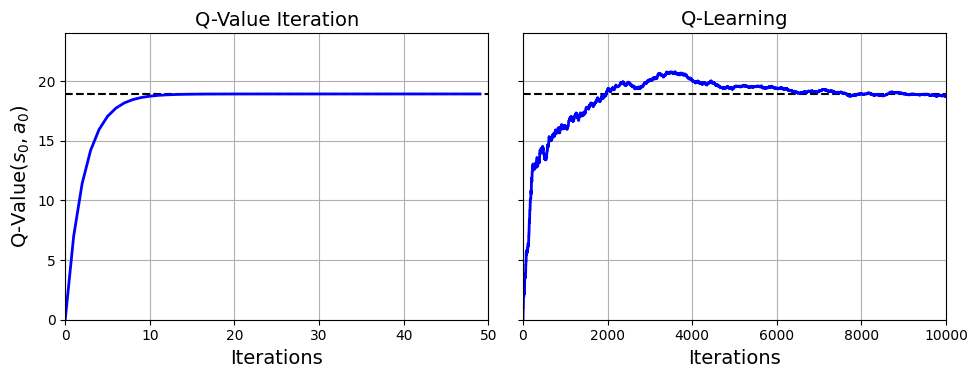

In [71]:
# extra code – this cell generates and saves Figure 18–9

true_Q_value = history1[-1, 0, 0]

fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)
axes[0].set_ylabel("Q-Value$(s_0, a_0)$", fontsize=14)
axes[0].set_title("Q-Value Iteration", fontsize=14)
axes[1].set_title("Q-Learning", fontsize=14)
for ax, width, history in zip(axes, (50, 10000), (history1, history2)):
    ax.plot([0, width], [true_Q_value, true_Q_value], "k--")
    ax.plot(np.arange(width), history[:, 0, 0], "b-", linewidth=2)
    ax.set_xlabel("Iterations", fontsize=14)
    ax.axis([0, width, 0, 24])
    ax.grid(True)

save_fig("q_value_plot")
plt.show()

# Deep Q-Network

Let's build the DQN. Given a state, it will estimate, for each possible action, the sum of discounted future rewards it can expect after it plays that action (but before it sees its outcome):

In [72]:
tf.random.set_seed(42)  # extra code – ensures reproducibility on the CPU

input_shape = [4]  # == env.observation_space.shape
n_outputs = 2  # == env.action_space.n

model = tf.keras.Sequential([
    tf.keras.layers.Dense(32, activation="elu", input_shape=input_shape),
    tf.keras.layers.Dense(32, activation="elu"),
    tf.keras.layers.Dense(n_outputs)
])

/usr/local/miniconda3/lib/python3.9/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


To select an action using this DQN, we just pick the action with the largest predicted Q-value. However, to ensure that the agent explores the environment, we choose a random action with probability `epsilon`.

In [22]:
def epsilon_greedy_policy(state, epsilon=0):
    if np.random.rand() < epsilon:
        return np.random.randint(n_outputs)  # random action
    else:
        Q_values = model.predict(state[np.newaxis], verbose=0)[0]
        return Q_values.argmax()  # optimal action according to the DQN

We will also need a replay buffer. It will contain the agent's experiences, in the form of tuples: `(obs, action, reward, next_obs, done)`. We can use the `deque` class for that:

In [74]:
from collections import deque

replay_buffer = deque(maxlen=2000)

**Note**: for very large replay buffers, you may want to use a circular buffer instead, as random access time will be O(1) instead of O(N). Or you can check out DeepMind's [Reverb library](https://github.com/deepmind/reverb).

In [75]:
# extra code – A basic circular buffer implementation

class ReplayBuffer:
    def __init__(self, max_size):
        self.buffer = np.empty(max_size, dtype=object)
        self.max_size = max_size
        self.index = 0
        self.size = 0

    def append(self, obj):
        self.buffer[self.index] = obj
        self.size = min(self.size + 1, self.max_size)
        self.index = (self.index + 1) % self.max_size

    def sample(self, batch_size):
        indices = np.random.randint(self.size, size=batch_size)
        return self.buffer[indices]

And let's create a function to sample experiences from the replay buffer. It will return 6 NumPy arrays: `[obs, actions, rewards, next_obs, dones, truncateds]`.

In [76]:
def sample_experiences(batch_size):
    indices = np.random.randint(len(replay_buffer), size=batch_size)
    batch = [replay_buffer[index] for index in indices]
    return [
        np.array([experience[field_index] for experience in batch])
        for field_index in range(6)
    ]  # [states, actions, rewards, next_states, dones, truncateds]

Now we can create a function that will use the DQN to play one step, and record its experience in the replay buffer:

In [77]:
def play_one_step(env, state, epsilon):
    action = epsilon_greedy_policy(state, epsilon)
    next_state, reward, done, truncated, info = env.step(action)
    replay_buffer.append((state, action, reward, next_state, done, truncated))
    return next_state, reward, done, truncated, info

Lastly, let's create a function that will sample some experiences from the replay buffer and perform a training step:

In [78]:
# extra code – for reproducibility, and to generate the next figure
env.reset(seed=42)
np.random.seed(42)
tf.random.set_seed(42)
rewards = [] 
best_score = 0

In [80]:
batch_size = 32
discount_factor = 0.95
optimizer = tf.keras.optimizers.Nadam(learning_rate=1e-2)
loss_fn = tf.keras.losses.MeanSquaredError() 

def training_step(batch_size):
    experiences = sample_experiences(batch_size)
    states, actions, rewards, next_states, dones, truncateds = experiences
    next_Q_values = model.predict(next_states, verbose=0)
    max_next_Q_values = next_Q_values.max(axis=1)
    runs = 1.0 - (dones | truncateds)  # episode is not done or truncated
    target_Q_values = rewards + runs * discount_factor * max_next_Q_values
    target_Q_values = target_Q_values.reshape(-1, 1)
    mask = tf.one_hot(actions, n_outputs)
    with tf.GradientTape() as tape:
        all_Q_values = model(states)
        Q_values = tf.reduce_sum(all_Q_values * mask, axis=1, keepdims=True)
        loss = tf.reduce_mean(loss_fn(target_Q_values, Q_values))

    grads = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))

And now, let's train the model!

In [81]:
for episode in range(600):
    obs, info = env.reset()    
    for step in range(200):
        epsilon = max(1 - episode / 500, 0.01)
        obs, reward, done, truncated, info = play_one_step(env, obs, epsilon)
        if done or truncated:
            break

    # extra code – displays debug info, stores data for the next figure, and
    #              keeps track of the best model weights so far
    print(f"\rEpisode: {episode + 1}, Steps: {step + 1}, eps: {epsilon:.3f}",
          end="")
    rewards.append(step)
    if step >= best_score:
        best_weights = model.get_weights()
        best_score = step

    if episode > 50:
        training_step(batch_size)

model.set_weights(best_weights)  # extra code – restores the best model weights

Episode: 600, Steps: 200, eps: 0.010

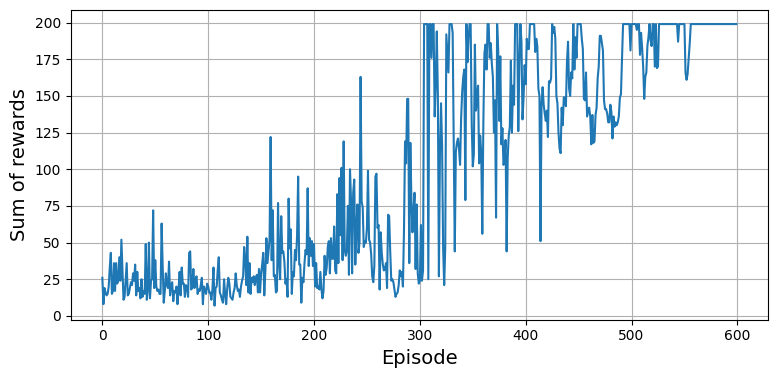

In [82]:
# extra code – this cell generates and saves Figure 18–10
plt.figure(figsize=(8, 4))
plt.plot(rewards)
plt.xlabel("Episode", fontsize=14)
plt.ylabel("Sum of rewards", fontsize=14)
plt.grid(True)
save_fig("dqn_rewards_plot")
plt.show()

In [83]:
# extra code – shows an animation of the trained DQN playing one episode
show_one_episode(epsilon_greedy_policy)

Not bad at all! 😀

## Fixed Q-Value Targets

Let's create the online DQN:

In [84]:
# extra code – creates the same DQN model as earlier

tf.random.set_seed(42)

model = tf.keras.Sequential([
    tf.keras.layers.Dense(32, activation="elu", input_shape=input_shape),
    tf.keras.layers.Dense(32, activation="elu"),
    tf.keras.layers.Dense(n_outputs)
])

/usr/local/miniconda3/lib/python3.9/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Now create the target DQN: it's just a clone of the online DQN:

In [85]:
target = tf.keras.models.clone_model(model)  # clone the model's architecture
target.set_weights(model.get_weights())  # copy the weights

Next, we use the same code as above except for the line marked with `# <= CHANGED`:

In [87]:
env.reset(seed=42)
np.random.seed(42)
tf.random.set_seed(42)
rewards = [] 
best_score = 0

batch_size = 32
discount_factor = 0.95
optimizer = tf.keras.optimizers.Nadam(learning_rate=1e-2)
loss_fn = tf.keras.losses.MeanSquaredError() 

replay_buffer = deque(maxlen=2000)  # resets the replay buffer

def training_step(batch_size):
    experiences = sample_experiences(batch_size)
    states, actions, rewards, next_states, dones, truncateds = experiences
    next_Q_values = target.predict(next_states, verbose=0)  # <= CHANGED
    max_next_Q_values = next_Q_values.max(axis=1)
    runs = 1.0 - (dones | truncateds)  # episode is not done or truncated
    target_Q_values = rewards + runs * discount_factor * max_next_Q_values
    target_Q_values = target_Q_values.reshape(-1, 1)
    mask = tf.one_hot(actions, n_outputs)
    with tf.GradientTape() as tape:
        all_Q_values = model(states)
        Q_values = tf.reduce_sum(all_Q_values * mask, axis=1, keepdims=True)
        loss = tf.reduce_mean(loss_fn(target_Q_values, Q_values))

    grads = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))

Again, this is the same code as earlier, except for the lines marked with `# <= CHANGED`:

In [88]:
for episode in range(600):
    obs, info = env.reset()    
    for step in range(200):
        epsilon = max(1 - episode / 500, 0.01)
        obs, reward, done, info, truncated = play_one_step(env, obs, epsilon)
        if done or truncated:
            break

    # extra code – displays debug info, stores data for the next figure, and
    #              keeps track of the best model weights so far
    print(f"\rEpisode: {episode + 1}, Steps: {step + 1}, eps: {epsilon:.3f}",
          end="")
    rewards.append(step)
    if step >= best_score:
        best_weights = model.get_weights()
        best_score = step

    if episode > 50:
        training_step(batch_size)
        if episode % 50 == 0:                        # <= CHANGED
            target.set_weights(model.get_weights())  # <= CHANGED

    # Alternatively, you can do soft updates at each step:
    #if episode > 50:
        #training_step(batch_size)
        #target_weights = target.get_weights()
        #online_weights = model.get_weights()
        #for index, online_weight in enumerate(online_weights):
        #    target_weights[index] = (0.99 * target_weights[index]
        #                             + 0.01 * online_weight)
        #target.set_weights(target_weights)

model.set_weights(best_weights)  # extra code – restores the best model weights

Episode: 600, Steps: 166, eps: 0.010

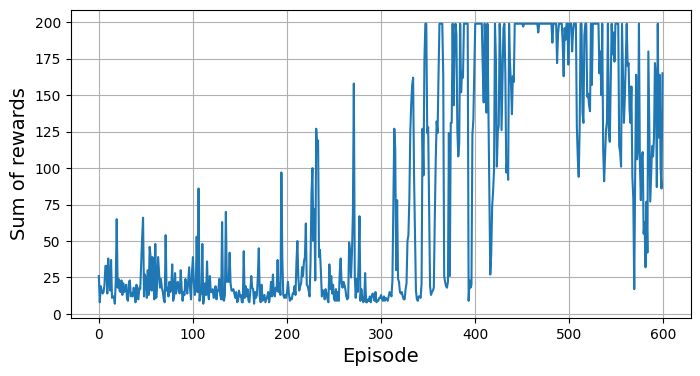

In [89]:
# extra code – this cell plots the learning curve
plt.figure(figsize=(8, 4))
plt.plot(rewards)
plt.xlabel("Episode", fontsize=14)
plt.ylabel("Sum of rewards", fontsize=14)
plt.grid(True)
plt.show()

In [90]:
# extra code – shows an animation of the trained DQN playing one episode
show_one_episode(epsilon_greedy_policy)

## Double DQN

The code is exactly the same as for fixed Q-Value targets, except for the section marked as changed in the `training_step()` function:

In [93]:
import tensorflow as tf
print(tf.__version__)
print("GPU Available: ", tf.config.list_physical_devices('GPU'))

2.18.0
GPU Available:  [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:2', device_type='GPU')]


In [ ]:
tf.random.set_seed(42)

with tf.device('/GPU:0'):
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(32, activation="elu", input_shape=input_shape),
        tf.keras.layers.Dense(32, activation="elu"),
        tf.keras.layers.Dense(n_outputs)
    ])

    target = tf.keras.models.clone_model(model)  # clone the model's architecture
    target.set_weights(model.get_weights())  # copy the weights

env.reset(seed=42)
np.random.seed(42)
tf.random.set_seed(42)
rewards = [] 
best_score = 0

batch_size = 32
discount_factor = 0.95
optimizer = tf.keras.optimizers.Nadam(learning_rate=1e-2)
loss_fn = tf.keras.losses.MeanSquaredError() 

def training_step(batch_size):
    experiences = sample_experiences(batch_size)
    states, actions, rewards, next_states, dones, truncateds = experiences

    #################### CHANGED SECTION ####################
    next_Q_values = model.predict(next_states, verbose=0)  # ≠ target.predict()
    best_next_actions = next_Q_values.argmax(axis=1)
    next_mask = tf.one_hot(best_next_actions, n_outputs).numpy()
    max_next_Q_values = (target.predict(next_states, verbose=0) * next_mask
                        ).sum(axis=1)
    #########################################################

    runs = 1.0 - (dones | truncateds)  # episode is not done or truncated
    target_Q_values = rewards + runs * discount_factor * max_next_Q_values
    target_Q_values = target_Q_values.reshape(-1, 1)
    mask = tf.one_hot(actions, n_outputs)
    with tf.GradientTape() as tape:
        all_Q_values = model(states)
        Q_values = tf.reduce_sum(all_Q_values * mask, axis=1, keepdims=True)
        loss = tf.reduce_mean(loss_fn(target_Q_values, Q_values))

    grads = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))

replay_buffer = deque(maxlen=2000)

for episode in range(600):
    obs, info = env.reset()    
    for step in range(200):
        epsilon = max(1 - episode / 500, 0.01)
        obs, reward, done, info, truncated = play_one_step(env, obs, epsilon)
        if done or truncated:
            break

    print(f"\rEpisode: {episode + 1}, Steps: {step + 1}, eps: {epsilon:.3f}",
          end="")
    rewards.append(step)
    if step >= best_score:
        best_weights = model.get_weights()
        best_score = step

    if episode > 50:
        training_step(batch_size)
        if episode % 50 == 0:
            target.set_weights(model.get_weights())

model.set_weights(best_weights)

Episode: 168, Steps: 74, eps: 0.666

KeyboardInterrupt: 

try using larger env

In [ ]:
import tensorflow as tf
import numpy as np
from collections import deque
import gymnasium as gym

# Enable mixed precision training
from tensorflow.keras.mixed_precision import set_global_policy
set_global_policy('mixed_float16')  # Enable mixed precision

# Set random seeds
tf.random.set_seed(42)
np.random.seed(42)

# Enable GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

# Initialize environment
env = gym.make("LunarLander-v3")
input_shape = env.observation_space.shape  # Dynamically set input shape
n_outputs = env.action_space.n            # Dynamically set number of actions

# Hyperparameters
batch_size = 512
discount_factor = 0.95
learning_rate = 1e-3

# Model and target network creation on GPU
with tf.device('/GPU:0'):
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(1024, activation="elu", input_shape=input_shape),
        tf.keras.layers.Dense(1024, activation="elu"),
        tf.keras.layers.Dense(n_outputs, dtype='float32')  # Ensure output is float32 for stability
    ])
    target = tf.keras.models.clone_model(model)
    target.set_weights(model.get_weights())

# Optimizer and loss function
optimizer = tf.keras.optimizers.Nadam(learning_rate=learning_rate)
loss_fn = tf.keras.losses.MeanSquaredError()

# Replay buffer
replay_buffer = deque(maxlen=100000)

# Sample experiences
def sample_experiences(batch_size):
    indices = np.random.choice(len(replay_buffer), batch_size, replace=False)
    batch = [replay_buffer[idx] for idx in indices]
    states, actions, rewards, next_states, dones, truncateds = zip(*batch)
    return (
        tf.convert_to_tensor(np.array(states), dtype=tf.float32),
        tf.convert_to_tensor(np.array(actions), dtype=tf.int32),
        tf.convert_to_tensor(np.array(rewards), dtype=tf.float32),
        tf.convert_to_tensor(np.array(next_states), dtype=tf.float32),
        tf.convert_to_tensor(np.array(dones), dtype=tf.float32),
        tf.convert_to_tensor(np.array(truncateds), dtype=tf.float32),
    )

# Play one step in the environment
def play_one_step(env, obs, epsilon):
    if np.random.rand() < epsilon:
        action = env.action_space.sample()  # Explore
    else:
        Q_values = model(obs[np.newaxis], training=False)
        action = tf.argmax(Q_values, axis=1).numpy()[0]

    next_obs, reward, done, truncated, info = env.step(action)
    replay_buffer.append((obs, action, reward, next_obs, done, truncated))
    return next_obs, reward, done, info, truncated

# Training step with @tf.function for graph execution
@tf.function
def training_step(batch_size):
    states, actions, rewards, next_states, dones, truncateds = sample_experiences(batch_size)

    next_Q_values = model(next_states, training=False)
    best_next_actions = tf.argmax(next_Q_values, axis=1)
    next_mask = tf.one_hot(best_next_actions, n_outputs)
    max_next_Q_values = tf.reduce_sum(target(next_states, training=False) * next_mask, axis=1)

    runs = 1.0 - (dones + truncateds)
    target_Q_values = rewards + runs * discount_factor * max_next_Q_values
    target_Q_values = tf.reshape(target_Q_values, (-1, 1))

    mask = tf.one_hot(actions, n_outputs)
    with tf.GradientTape() as tape:
        all_Q_values = model(states, training=True)
        Q_values = tf.reduce_sum(all_Q_values * mask, axis=1, keepdims=True)
        loss = tf.reduce_mean(loss_fn(target_Q_values, Q_values))

    grads = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))

# Training loop
rewards = []
best_score = 0

for episode in range(1000):
    obs, info = env.reset(seed=42)
    for step in range(1000):  # Increased step limit for complex environments
        epsilon = max(1 - episode / 800, 0.01)
        obs, reward, done, info, truncated = play_one_step(env, obs, epsilon)
        if done or truncated:
            break

    print(f"\rEpisode: {episode + 1}, Steps: {step + 1}, eps: {epsilon:.3f}", end="")
    rewards.append(step)
    if step >= best_score:
        best_weights = model.get_weights()
        best_score = step

    if episode > 50 and len(replay_buffer) >= batch_size:
        training_step(batch_size)
        if episode % 50 == 0:
            target.set_weights(model.get_weights())

# Set model weights to the best ones
model.set_weights(best_weights)

spiking to 76% gpu utilization, fluctuating between 7-21,22

In [9]:
import tensorflow as tf
import numpy as np
from collections import deque
import gymnasium as gym

# Enable mixed precision training
from tensorflow.keras.mixed_precision import set_global_policy
set_global_policy('mixed_float16')  # Enable mixed precision

# Set random seeds
tf.random.set_seed(42)
np.random.seed(42)

# Enable GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

# Hyperparameters
batch_size = 1024  # Increased batch size
discount_factor = 0.95
learning_rate = 1e-2
input_shape = (4,)  # Example input shape, adjust based on your environment
n_outputs = 2       # Example action space, adjust based on your environment

# Model and target network creation on GPU
with tf.device('/GPU:0'):
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(8192, activation="elu", input_shape=input_shape),  # Increased layer size
        tf.keras.layers.Dense(8192, activation="elu"),  # Increased layer size
        tf.keras.layers.Dense(n_outputs, dtype='float32')  # Ensure output is float32 for stability
    ])
    target = tf.keras.models.clone_model(model)
    target.set_weights(model.get_weights())

# Optimizer and loss function
optimizer = tf.keras.optimizers.Nadam(learning_rate=learning_rate)
loss_fn = tf.keras.losses.MeanSquaredError()

# Replay buffer
replay_buffer = deque(maxlen=100000)  # Larger replay buffer for better training

# Sample experiences
def sample_experiences(batch_size):
    indices = np.random.choice(len(replay_buffer), batch_size, replace=False)
    batch = [replay_buffer[idx] for idx in indices]
    states, actions, rewards, next_states, dones, truncateds = zip(*batch)
    return (
        tf.convert_to_tensor(np.array(states), dtype=tf.float32),
        tf.convert_to_tensor(np.array(actions), dtype=tf.int32),
        tf.convert_to_tensor(np.array(rewards), dtype=tf.float32),
        tf.convert_to_tensor(np.array(next_states), dtype=tf.float32),
        tf.convert_to_tensor(np.array(dones), dtype=tf.float32),
        tf.convert_to_tensor(np.array(truncateds), dtype=tf.float32),
    )

# Play one step in the environment
def play_one_step(env, obs, epsilon):
    if np.random.rand() < epsilon:
        action = env.action_space.sample()  # Explore
    else:
        Q_values = model(obs[np.newaxis], training=False)
        action = tf.argmax(Q_values, axis=1).numpy()[0]

    next_obs, reward, done, truncated, info = env.step(action)  # Fixed unpacking
    replay_buffer.append((obs, action, reward, next_obs, done, truncated))
    return next_obs, reward, done, info, truncated

# Training step with @tf.function for graph execution
@tf.function
def training_step(batch_size):
    states, actions, rewards, next_states, dones, truncateds = sample_experiences(batch_size)

    with tf.device('/GPU:0'):  # Ensure computations are on the GPU
        next_Q_values = model(next_states, training=False)  # GPU-optimized
        best_next_actions = tf.argmax(next_Q_values, axis=1)
        next_mask = tf.one_hot(best_next_actions, n_outputs)
        max_next_Q_values = tf.reduce_sum(target(next_states, training=False) * next_mask, axis=1)

        runs = 1.0 - (dones + truncateds)
        target_Q_values = rewards + runs * discount_factor * max_next_Q_values
        target_Q_values = tf.reshape(target_Q_values, (-1, 1))

        mask = tf.one_hot(actions, n_outputs)
        with tf.GradientTape() as tape:
            all_Q_values = model(states, training=True)
            Q_values = tf.reduce_sum(all_Q_values * mask, axis=1, keepdims=True)
            loss = tf.reduce_mean(loss_fn(target_Q_values, Q_values))

        grads = tape.gradient(loss, model.trainable_variables)
        optimizer.apply_gradients(zip(grads, model.trainable_variables))

# Training loop
env = gym.make("CartPole-v1")  # Example environment
rewards = []
best_score = 0

for episode in range(1000):  # Increased episodes for better GPU utilization
    obs, info = env.reset(seed=42)
    for step in range(500):  # Increased step limit
        epsilon = max(1 - episode / 800, 0.01)  # Adjusted exploration rate
        obs, reward, done, info, truncated = play_one_step(env, obs, epsilon)
        if done or truncated:
            break

    print(f"\rEpisode: {episode + 1}, Steps: {step + 1}, eps: {epsilon:.3f}", end="")
    rewards.append(step)
    if step >= best_score:
        best_weights = model.get_weights()
        best_score = step

    if episode > 50:
        training_step(batch_size)
        if episode % 50 == 0:
            target.set_weights(model.get_weights())

# Set model weights to the best ones
model.set_weights(best_weights)

Episode: 1000, Steps: 181, eps: 0.010

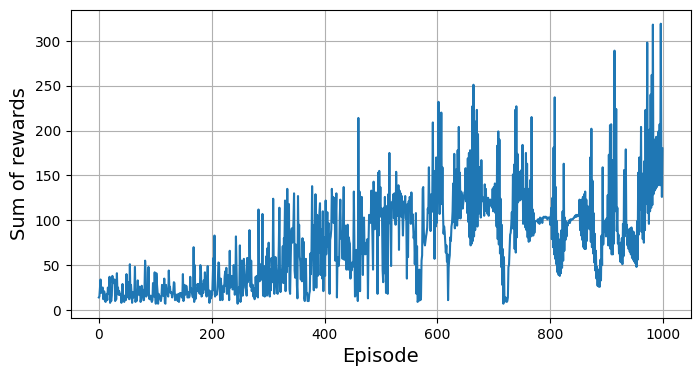

In [12]:
# extra code – this cell plots the learning curve
plt.figure(figsize=(8, 4))
plt.plot(rewards)
plt.xlabel("Episode", fontsize=14)
plt.ylabel("Sum of rewards", fontsize=14)
plt.grid(True)
plt.show()

In [23]:
# extra code – shows an animation of the trained DQN playing one episode
show_one_episode(epsilon_greedy_policy)

1gpu run with small utilization

In [98]:
import tensorflow as tf
import numpy as np
from collections import deque
import gymnasium as gym

# Set random seeds
tf.random.set_seed(42)
np.random.seed(42)

# Enable GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

# Hyperparameters
batch_size = 32
discount_factor = 0.95
learning_rate = 1e-2
input_shape = (4,)  # Example input shape, adjust based on your environment
n_outputs = 2       # Example action space, adjust based on your environment

# Model and target network creation on GPU
with tf.device('/GPU:0'):
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(32, activation="elu", input_shape=input_shape),
        tf.keras.layers.Dense(32, activation="elu"),
        tf.keras.layers.Dense(n_outputs)
    ])
    target = tf.keras.models.clone_model(model)
    target.set_weights(model.get_weights())

# Optimizer and loss function
optimizer = tf.keras.optimizers.Nadam(learning_rate=learning_rate)
loss_fn = tf.keras.losses.MeanSquaredError()

# Replay buffer
replay_buffer = deque(maxlen=2000)

# Sample experiences
def sample_experiences(batch_size):
    indices = np.random.choice(len(replay_buffer), batch_size, replace=False)
    batch = [replay_buffer[idx] for idx in indices]
    states, actions, rewards, next_states, dones, truncateds = zip(*batch)
    return (
        np.array(states), 
        np.array(actions), 
        np.array(rewards), 
        np.array(next_states), 
        np.array(dones), 
        np.array(truncateds)
    )

# Play one step in the environment
def play_one_step(env, obs, epsilon):
    if np.random.rand() < epsilon:
        action = env.action_space.sample()  # Explore
    else:
        Q_values = model(obs[np.newaxis], training=False)
        action = np.argmax(Q_values)

    next_obs, reward, done, truncated, info = env.step(action)  # Fixed unpacking
    replay_buffer.append((obs, action, reward, next_obs, done, truncated))
    return next_obs, reward, done, info, truncated

# Training step
def training_step(batch_size):
    experiences = sample_experiences(batch_size)
    states, actions, rewards, next_states, dones, truncateds = experiences

    with tf.device('/GPU:0'):  # Ensure computations are on the GPU
        next_Q_values = model(next_states, training=False)  # GPU-optimized
        best_next_actions = tf.argmax(next_Q_values, axis=1)
        next_mask = tf.one_hot(best_next_actions, n_outputs)
        max_next_Q_values = tf.reduce_sum(target(next_states, training=False) * next_mask, axis=1)

        runs = 1.0 - tf.cast(dones | truncateds, tf.float32)
        target_Q_values = rewards + runs * discount_factor * max_next_Q_values
        target_Q_values = tf.reshape(target_Q_values, (-1, 1))

        mask = tf.one_hot(actions, n_outputs)
        with tf.GradientTape() as tape:
            all_Q_values = model(states, training=True)
            Q_values = tf.reduce_sum(all_Q_values * mask, axis=1, keepdims=True)
            loss = tf.reduce_mean(loss_fn(target_Q_values, Q_values))

        grads = tape.gradient(loss, model.trainable_variables)
        optimizer.apply_gradients(zip(grads, model.trainable_variables))

# Training loop
env = gym.make("CartPole-v1")  # Example environment
rewards = []
best_score = 0

for episode in range(600):
    obs, info = env.reset(seed=42)
    for step in range(200):
        epsilon = max(1 - episode / 500, 0.01)
        obs, reward, done, info, truncated = play_one_step(env, obs, epsilon)
        if done or truncated:
            break

    print(f"\rEpisode: {episode + 1}, Steps: {step + 1}, eps: {epsilon:.3f}", end="")
    rewards.append(step)
    if step >= best_score:
        best_weights = model.get_weights()
        best_score = step

    if episode > 50:
        training_step(batch_size)
        if episode % 50 == 0:
            target.set_weights(model.get_weights())

# Set model weights to the best ones
model.set_weights(best_weights)

Physical devices cannot be modified after being initialized
Episode: 600, Steps: 200, eps: 0.010

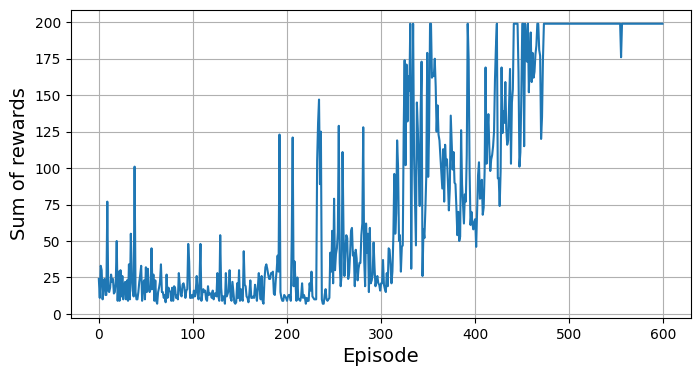

In [99]:
# extra code – this cell plots the learning curve
plt.figure(figsize=(8, 4))
plt.plot(rewards)
plt.xlabel("Episode", fontsize=14)
plt.ylabel("Sum of rewards", fontsize=14)
plt.grid(True)
plt.show()

In [100]:
# extra code – shows an animation of the trained DQN playing one episode
show_one_episode(epsilon_greedy_policy)

# Dueling Double DQN

In [69]:
tf.random.set_seed(42)  # extra code – ensures reproducibility on the CPU

input_states = tf.keras.layers.Input(shape=[4])
hidden1 = tf.keras.layers.Dense(32, activation="elu")(input_states)
hidden2 = tf.keras.layers.Dense(32, activation="elu")(hidden1)
state_values = tf.keras.layers.Dense(1)(hidden2)
raw_advantages = tf.keras.layers.Dense(n_outputs)(hidden2)
advantages = raw_advantages - tf.reduce_max(raw_advantages, axis=1,
                                            keepdims=True)
Q_values = state_values + advantages
model = tf.keras.Model(inputs=[input_states], outputs=[Q_values])

The rest is the same code as earlier:

In [70]:
# extra code – trains the model

batch_size = 32
discount_factor = 0.95
optimizer = tf.keras.optimizers.Nadam(learning_rate=5e-3)
loss_fn = tf.keras.losses.mean_squared_error

target = tf.keras.models.clone_model(model)  # clone the model's architecture
target.set_weights(model.get_weights())  # copy the weights

env.reset(seed=42)
replay_buffer = deque(maxlen=2000)
rewards = []
best_score = 0

for episode in range(600):
    obs, info = env.reset()    
    for step in range(200):
        epsilon = max(1 - episode / 500, 0.01)
        obs, reward, done, info, truncated = play_one_step(env, obs, epsilon)
        if done or truncated:
            break

    print(f"\rEpisode: {episode + 1}, Steps: {step + 1}, eps: {epsilon:.3f}",
          end="")
    rewards.append(step)
    if step >= best_score:
        best_weights = model.get_weights()
        best_score = step

    if episode > 50:
        training_step(batch_size)
        if episode % 50 == 0:
            target.set_weights(model.get_weights())

model.set_weights(best_weights)

Episode: 600, Steps: 137, eps: 0.010

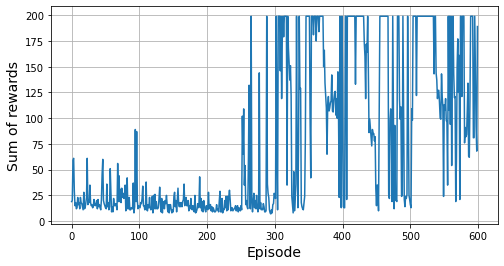

In [71]:
# extra code – this cell plots the learning curve
plt.figure(figsize=(8, 4))
plt.plot(rewards)
plt.xlabel("Episode", fontsize=14)
plt.ylabel("Sum of rewards", fontsize=14)
plt.grid(True)
plt.show()

In [72]:
# extra code – shows an animation of the trained DQN playing one episode
show_one_episode(epsilon_greedy_policy)

This looks like a pretty robust agent!

In [73]:
env.close()

spike to 97% gpu utilization, fluctuating between 26-90

Episode: 6, Steps: 136, eps: 0.994

/usr/local/miniconda3/lib/python3.9/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_299']
Received: inputs=Tensor(shape=(1, 8))
  warnings.warn(msg)


Episode: 52, Steps: 119, eps: 0.936

/usr/local/miniconda3/lib/python3.9/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_299']
Received: inputs=Tensor(shape=(4096, 8))
  warnings.warn(msg)


Episode: 600, Steps: 237, eps: 0.251

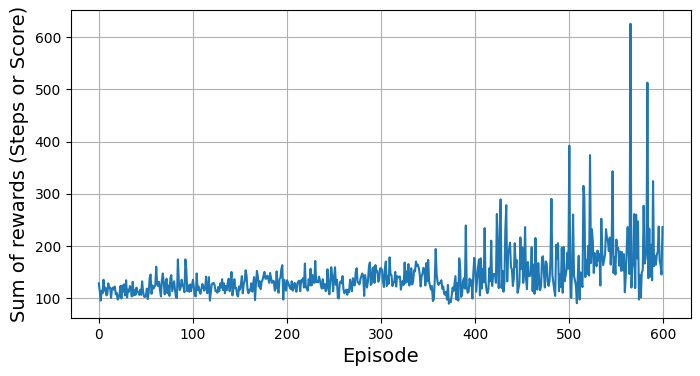

In [40]:
import tensorflow as tf
import numpy as np
from collections import deque
import gymnasium as gym
import matplotlib.pyplot as plt

# Enable mixed precision training
from tensorflow.keras.mixed_precision import set_global_policy
set_global_policy('mixed_float16')  # Enable mixed precision

# Set random seeds
tf.random.set_seed(42)
np.random.seed(42)

# Enable GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

# Initialize environment
env = gym.make("LunarLander-v3")  
input_shape = env.observation_space.shape  # e.g. (8,)
n_outputs = env.action_space.n

# Hyperparameters
batch_size = 4096
discount_factor = 0.95
learning_rate = 5e-4

# Custom layer to compute advantages
class AdvantageLayer(tf.keras.layers.Layer):
    def call(self, raw_advantages):
        # Subtract max over actions to keep Q-values stable
        max_adv = tf.reduce_max(raw_advantages, axis=1, keepdims=True)
        return raw_advantages - max_adv

# Build the model
with tf.device('/GPU:0'):
    input_states = tf.keras.layers.Input(shape=input_shape)
    hidden1 = tf.keras.layers.Dense(16384, activation="elu")(input_states)
    hidden2 = tf.keras.layers.Dense(16384, activation="elu")(hidden1)

    state_values = tf.keras.layers.Dense(1)(hidden2)
    raw_advantages = tf.keras.layers.Dense(n_outputs)(hidden2)
    
    advantages = AdvantageLayer()(raw_advantages)
    Q_values = tf.keras.layers.Add()([state_values, advantages])
    
    model = tf.keras.Model(inputs=[input_states], outputs=[Q_values])

# Create target network
target = tf.keras.models.clone_model(model)
target.set_weights(model.get_weights())

# Optimizer and loss
optimizer = tf.keras.optimizers.Nadam(learning_rate=learning_rate)
loss_fn = tf.keras.losses.MeanSquaredError()

# Replay buffer
replay_buffer = deque(maxlen=100000)

def sample_experiences(batch_size):
    """Randomly sample a batch of experiences from the replay buffer."""
    indices = np.random.choice(len(replay_buffer), batch_size, replace=False)
    batch = [replay_buffer[idx] for idx in indices]
    states, actions, rewards, next_states, dones, truncateds = zip(*batch)
    return (
        tf.convert_to_tensor(np.array(states), dtype=tf.float32),   # We'll let the model cast states automatically
        tf.convert_to_tensor(np.array(actions), dtype=tf.int32),
        tf.convert_to_tensor(np.array(rewards), dtype=tf.float32),
        tf.convert_to_tensor(np.array(next_states), dtype=tf.float32),
        tf.convert_to_tensor(np.array(dones), dtype=tf.float32),
        tf.convert_to_tensor(np.array(truncateds), dtype=tf.float32),
    )

def play_one_step(env, obs, epsilon):
    """Executes one step in the environment with epsilon-greedy policy."""
    if np.random.rand() < epsilon:
        action = env.action_space.sample()  # Explore
    else:
        # Model expects shape (None, obs_dim)
        Q_val = model(obs[np.newaxis], training=False)
        action = tf.argmax(Q_val, axis=1).numpy()[0]

    next_obs, reward, done, truncated, info = env.step(action)
    replay_buffer.append((obs, action, reward, next_obs, done, truncated))
    return next_obs, reward, done, info, truncated

@tf.function
def training_step(batch_size):
    """One training step using a batch from the replay buffer."""
    states, actions, rewards, next_states, dones, truncateds = sample_experiences(batch_size)
    
    # Cast certain Tensors to float16 to match the model outputs (which are in float16)
    rewards = tf.cast(rewards, tf.float16)
    dones = tf.cast(dones, tf.float16)
    truncateds = tf.cast(truncateds, tf.float16)

    # Next Q-values from the *current* model (float16 output)
    next_Q_values = model(tf.cast(next_states, tf.float16), training=False)
    best_next_actions = tf.argmax(next_Q_values, axis=1)  # shape=(batch,)

    # One-hot for picking the best action from the target network
    next_mask = tf.one_hot(best_next_actions, n_outputs)  # default float32
    next_mask = tf.cast(next_mask, tf.float16)

    # Q-values from the target network (float16 output)
    target_Q = target(tf.cast(next_states, tf.float16), training=False)
    max_next_Q_values = tf.reduce_sum(target_Q * next_mask, axis=1)  # float16

    # runs = 1 - (done + truncated) => whether next_state is valid
    runs = tf.constant(1.0, dtype=tf.float16) - (dones + truncateds)  # float16

    # discount_factor is a Python float => cast to float16
    discount_factor_tf = tf.cast(discount_factor, tf.float16)

    # Compute target Q
    target_Q_values = rewards + runs * discount_factor_tf * max_next_Q_values
    target_Q_values = tf.reshape(target_Q_values, (-1, 1))

    # Mask for actions taken
    mask = tf.one_hot(actions, n_outputs)  # float32
    mask = tf.cast(mask, tf.float16)

    # Forward pass on current states
    with tf.GradientTape() as tape:
        # Cast states to float16 so everything is consistent
        all_Q_values = model(tf.cast(states, tf.float16), training=True)
        Q_values = tf.reduce_sum(all_Q_values * mask, axis=1, keepdims=True)
        loss = tf.reduce_mean(loss_fn(target_Q_values, Q_values))
    
    grads = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))

# --- Training Loop ---
rewards_log = []
best_score = 0
best_weights = None

for episode in range(600):  
    obs, info = env.reset(seed=42)
    for step in range(1000):
        epsilon = max(1 - episode / 800, 0.01)
        obs, reward, done, info, truncated = play_one_step(env, obs, epsilon)
        if done or truncated:
            break
    
    print(f"\rEpisode: {episode + 1}, Steps: {step + 1}, eps: {epsilon:.3f}", end="")
    rewards_log.append(step)
    
    # Track best score
    if step >= best_score:
        best_weights = model.get_weights()
        best_score = step

    # Train once we have enough samples
    if episode > 50 and len(replay_buffer) >= batch_size:
        training_step(batch_size)
        
        # Update target network every 50 episodes
        if episode % 50 == 0:
            target.set_weights(model.get_weights())

# Restore the best model weights
if best_weights is not None:
    model.set_weights(best_weights)

# Plot rewards
plt.figure(figsize=(8, 4))
plt.plot(rewards_log)
plt.xlabel("Episode", fontsize=14)
plt.ylabel("Sum of rewards (Steps or Score)", fontsize=14)
plt.grid(True)
plt.show()


In [42]:
import matplotlib
import matplotlib.pyplot as plt

def show_one_episode(policy, n_max_steps=1000, seed=42):
    frames = []
    env = gym.make("LunarLander-v3", render_mode="rgb_array")
    np.random.seed(seed)
    obs, info = env.reset(seed=seed)
    for step in range(n_max_steps):
        frames.append(env.render())
        action = policy(obs)  # your epsilon_greedy_policy
        obs, reward, done, truncated, info = env.step(action)
        if done or truncated:
            break
    env.close()
    return plot_animation(frames)  # same function from your code

In [43]:
show_one_episode(epsilon_greedy_policy)

In [48]:
import tensorflow as tf
import gymnasium as gym
import numpy as np

env = gym.make("CartPole-v1")
obs_shape = env.observation_space.shape  # (4,)
n_outputs = env.action_space.n          # 2

# Build a smaller network for CartPole
inputs = tf.keras.layers.Input(shape=obs_shape)  # shape=(4,)
hidden1 = tf.keras.layers.Dense(64, activation="elu")(inputs)
hidden2 = tf.keras.layers.Dense(64, activation="elu")(hidden1)
outputs = tf.keras.layers.Dense(n_outputs)(hidden2)

cartpole_model = tf.keras.Model(inputs=inputs, outputs=outputs)

In [52]:
import random
from collections import deque

replay_buffer = deque(maxlen=10000)
optimizer = tf.keras.optimizers.Nadam(learning_rate=1e-3)
loss_fn = tf.keras.losses.MeanSquaredError() 
discount_factor = 0.99

def sample_experiences(batch_size):
    batch = random.sample(replay_buffer, batch_size)
    states, actions, rewards, next_states, dones = zip(*batch)
    return np.array(states), np.array(actions), np.array(rewards, dtype=np.float32),\
           np.array(next_states), np.array(dones, dtype=np.float32)

def play_one_step(env, obs, epsilon):
    if np.random.rand() < epsilon:
        action = env.action_space.sample()
    else:
        Q_values = cartpole_model(obs[np.newaxis], training=False).numpy()[0]
        action = np.argmax(Q_values)
    next_obs, reward, done, truncated, info = env.step(action)
    replay_buffer.append((obs, action, reward, next_obs, done or truncated))
    return next_obs, reward, done or truncated

@tf.function
def training_step(batch_size=64):
    states, actions, rewards, next_states, dones = sample_experiences(batch_size)

    # Cast data to float16 if the model is in mixed precision
    states = tf.cast(states, tf.float16)
    next_states = tf.cast(next_states, tf.float16)
    rewards = tf.cast(rewards, tf.float16)
    dones = tf.cast(dones, tf.float16)

    next_Q_values = cartpole_model(next_states, training=False)  # float16
    max_next_Q_values = tf.reduce_max(next_Q_values, axis=1)
    target_Q_values = rewards + (1.0 - dones) * discount_factor * max_next_Q_values

    target_Q_values = tf.expand_dims(target_Q_values, axis=1)  # shape=(batch_size, 1)

    mask = tf.one_hot(actions, n_outputs)          # float32
    mask = tf.cast(mask, dtype=tf.float16)         # now float16

    with tf.GradientTape() as tape:
        all_Q_values = cartpole_model(states, training=True)  # float16
        Q_values = tf.reduce_sum(all_Q_values * mask, axis=1, keepdims=True)
        loss = tf.reduce_mean(loss_fn(target_Q_values, Q_values))

    grads = tape.gradient(loss, cartpole_model.trainable_variables)
    optimizer.apply_gradients(zip(grads, cartpole_model.trainable_variables))


# A quick training loop
n_episodes = 200
batch_size = 64

for episode in range(n_episodes):
    obs, info = env.reset()
    epsilon = max(1 - episode / 150, 0.01)
    for step in range(200):
        obs, reward, done = play_one_step(env, obs, epsilon)
        if done:
            break
    if episode > 10 and len(replay_buffer) > batch_size:
        training_step(batch_size)
    if episode % 10 == 0:
        print("Episode:", episode)

Episode: 0
Episode: 10
Episode: 20
Episode: 30
Episode: 40
Episode: 50
Episode: 60
Episode: 70
Episode: 80
Episode: 90
Episode: 100
Episode: 110
Episode: 120
Episode: 130
Episode: 140
Episode: 150
Episode: 160
Episode: 170
Episode: 180
Episode: 190


In [53]:
import matplotlib
import matplotlib.pyplot as plt

def show_one_episode(policy, n_max_steps=200, seed=42):
    frames = []
    env = gym.make("CartPole-v1", render_mode="rgb_array")
    env.reset(seed=seed)
    obs, info = env.reset(seed=seed)
    for step in range(n_max_steps):
        frames.append(env.render())
        action = policy(obs)
        obs, reward, done, truncated, info = env.step(action)
        if done or truncated:
            break
    env.close()
    return plot_animation(frames)

anim = show_one_episode(epsilon_greedy_policy)
anim  # display in a notebook environment

2025-01-25 04:56:45.812199: W tensorflow/core/framework/op_kernel.cc:1841] OP_REQUIRES failed at xla_ops.cc:577 : INVALID_ARGUMENT: Matrix size-incompatible: In[0]: [1,4], In[1]: [8,16384]

Stack trace for op definition: 
File "usr/local/miniconda3/lib/python3.9/runpy.py", line 197, in _run_module_as_main
File "usr/local/miniconda3/lib/python3.9/runpy.py", line 87, in _run_code
File "usr/local/miniconda3/lib/python3.9/site-packages/ipykernel_launcher.py", line 17, in <module>
File "usr/local/miniconda3/lib/python3.9/site-packages/traitlets/config/application.py", line 992, in launch_instance
File "usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelapp.py", line 701, in start
File "usr/local/miniconda3/lib/python3.9/site-packages/tornado/platform/asyncio.py", line 195, in start
File "usr/local/miniconda3/lib/python3.9/asyncio/base_events.py", line 601, in run_forever
File "usr/local/miniconda3/lib/python3.9/asyncio/base_events.py", line 1905, in _run_once
File "usr/local/m

InvalidArgumentError: Graph execution error:

Detected at node functional_30_1/dense_87_1/MatMul defined at (most recent call last):
<stack traces unavailable>
Matrix size-incompatible: In[0]: [1,4], In[1]: [8,16384]

Stack trace for op definition: 
File "usr/local/miniconda3/lib/python3.9/runpy.py", line 197, in _run_module_as_main
File "usr/local/miniconda3/lib/python3.9/runpy.py", line 87, in _run_code
File "usr/local/miniconda3/lib/python3.9/site-packages/ipykernel_launcher.py", line 17, in <module>
File "usr/local/miniconda3/lib/python3.9/site-packages/traitlets/config/application.py", line 992, in launch_instance
File "usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelapp.py", line 701, in start
File "usr/local/miniconda3/lib/python3.9/site-packages/tornado/platform/asyncio.py", line 195, in start
File "usr/local/miniconda3/lib/python3.9/asyncio/base_events.py", line 601, in run_forever
File "usr/local/miniconda3/lib/python3.9/asyncio/base_events.py", line 1905, in _run_once
File "usr/local/miniconda3/lib/python3.9/asyncio/events.py", line 80, in _run
File "usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 534, in dispatch_queue
File "usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 523, in process_one
File "usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 429, in dispatch_shell
File "usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 767, in execute_request
File "usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 429, in do_execute
File "usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/zmqshell.py", line 549, in run_cell
File "usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3024, in run_cell
File "usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3079, in _run_cell
File "usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner
File "usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3284, in run_cell_async
File "usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3466, in run_ast_nodes
File "usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3526, in run_code
File "tmp/ipykernel_2353932/1282514305.py", line 1, in <module>
File "tmp/ipykernel_2353932/3092292862.py", line 11, in show_one_episode
File "tmp/ipykernel_2353932/3552904983.py", line 5, in epsilon_greedy_policy
File "usr/local/miniconda3/lib/python3.9/site-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler
File "usr/local/miniconda3/lib/python3.9/site-packages/keras/src/backend/tensorflow/trainer.py", line 562, in predict
File "usr/local/miniconda3/lib/python3.9/site-packages/keras/src/backend/tensorflow/trainer.py", line 259, in one_step_on_data_distributed
File "usr/local/miniconda3/lib/python3.9/site-packages/keras/src/backend/tensorflow/trainer.py", line 249, in one_step_on_data
File "usr/local/miniconda3/lib/python3.9/site-packages/keras/src/backend/tensorflow/trainer.py", line 104, in predict_step
File "usr/local/miniconda3/lib/python3.9/site-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler
File "usr/local/miniconda3/lib/python3.9/site-packages/keras/src/layers/layer.py", line 906, in __call__
File "usr/local/miniconda3/lib/python3.9/site-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler
File "usr/local/miniconda3/lib/python3.9/site-packages/keras/src/ops/operation.py", line 46, in __call__
File "usr/local/miniconda3/lib/python3.9/site-packages/keras/src/utils/traceback_utils.py", line 156, in error_handler
File "usr/local/miniconda3/lib/python3.9/site-packages/keras/src/models/functional.py", line 182, in call
File "usr/local/miniconda3/lib/python3.9/site-packages/keras/src/ops/function.py", line 171, in _run_through_graph
File "usr/local/miniconda3/lib/python3.9/site-packages/keras/src/models/functional.py", line 637, in call
File "usr/local/miniconda3/lib/python3.9/site-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler
File "usr/local/miniconda3/lib/python3.9/site-packages/keras/src/layers/layer.py", line 908, in __call__
File "usr/local/miniconda3/lib/python3.9/site-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler
File "usr/local/miniconda3/lib/python3.9/site-packages/keras/src/ops/operation.py", line 46, in __call__
File "usr/local/miniconda3/lib/python3.9/site-packages/keras/src/utils/traceback_utils.py", line 156, in error_handler
File "usr/local/miniconda3/lib/python3.9/site-packages/keras/src/layers/core/dense.py", line 144, in call
File "usr/local/miniconda3/lib/python3.9/site-packages/keras/src/ops/numpy.py", line 3815, in matmul
File "usr/local/miniconda3/lib/python3.9/site-packages/keras/src/backend/tensorflow/numpy.py", line 501, in matmul

	 [[{{node functional_30_1/dense_87_1/MatMul}}]]
	tf2xla conversion failed while converting __inference_one_step_on_data_4530353[]. Run with TF_DUMP_GRAPH_PREFIX=/path/to/dump/dir and --vmodule=xla_compiler=2 to obtain a dump of the compiled functions.
	 [[StatefulPartitionedCall]] [Op:__inference_one_step_on_data_distributed_4530372]

multi-gpu

In [39]:
import tensorflow as tf
import numpy as np
from collections import deque
import gymnasium as gym
import matplotlib.pyplot as plt

# ============================================
# 1. Create a MirroredStrategy for 3 GPUs
# ============================================
mirrored_strategy = tf.distribute.MirroredStrategy(
    devices=["/GPU:0", "/GPU:1", "/GPU:2"]  # or just MirroredStrategy() for all GPUs
)
print(f"Number of replicas in sync: {mirrored_strategy.num_replicas_in_sync}")

# Enable mixed precision training
from tensorflow.keras.mixed_precision import set_global_policy
set_global_policy('mixed_float16')  # enable mixed precision

# Set random seeds
tf.random.set_seed(42)
np.random.seed(42)

# Enable GPU memory growth (often recommended on multi-GPU setups)
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

# Initialize environment
env = gym.make("LunarLander-v3")  
input_shape = env.observation_space.shape  # e.g. (8,)
n_outputs = env.action_space.n

# Replay buffer
replay_buffer = deque(maxlen=100000)

# Hyperparameters
batch_size = 4095  # Must be divisible by 3 for 3 GPUs
discount_factor = 0.95
learning_rate = 5e-4

# ============================================
# 2. Define custom layer (AdvantageLayer)
#    for the Dueling DQN architecture
# ============================================
class AdvantageLayer(tf.keras.layers.Layer):
    def call(self, raw_advantages):
        # Subtract max over actions to keep Q-values stable
        max_adv = tf.reduce_max(raw_advantages, axis=1, keepdims=True)
        return raw_advantages - max_adv

# ============================================
# 3. Build model & optimizer inside strategy scope
# ============================================
with mirrored_strategy.scope():
    # Large network just for demonstration
    input_states = tf.keras.layers.Input(shape=input_shape)
    hidden1 = tf.keras.layers.Dense(16384, activation="elu")(input_states)
    hidden2 = tf.keras.layers.Dense(16384, activation="elu")(hidden1)

    # Dueling DQN heads
    state_values = tf.keras.layers.Dense(1)(hidden2)
    raw_advantages = tf.keras.layers.Dense(n_outputs)(hidden2)
    advantages = AdvantageLayer()(raw_advantages)
    Q_values = tf.keras.layers.Add()([state_values, advantages])
    
    model = tf.keras.Model(inputs=[input_states], outputs=[Q_values])

    # Target network
    target = tf.keras.models.clone_model(model)
    target.set_weights(model.get_weights())

    # Optimizer and loss
    optimizer = tf.keras.optimizers.Nadam(learning_rate=learning_rate)
    loss_fn = tf.keras.losses.MeanSquaredError()

# ============================================
# 4. Utility functions
# ============================================
def sample_experiences(batch_size):
    """Randomly sample a batch of experiences from the replay buffer."""
    indices = np.random.choice(len(replay_buffer), batch_size, replace=False)
    batch = [replay_buffer[idx] for idx in indices]
    states, actions, rewards, next_states, dones, truncateds = zip(*batch)
    return (
        np.array(states),      # shape [batch_size, obs_dim]
        np.array(actions),     # shape [batch_size]
        np.array(rewards),     # shape [batch_size]
        np.array(next_states), # shape [batch_size, obs_dim]
        np.array(dones),       # shape [batch_size]
        np.array(truncateds),  # shape [batch_size]
    )

def play_one_step(env, obs, epsilon):
    """Executes one step in the environment with epsilon-greedy policy."""
    if np.random.rand() < epsilon:
        action = env.action_space.sample()  # Explore
    else:
        # Model expects shape (None, obs_dim)
        Q_val = model(obs[np.newaxis], training=False)
        action = tf.argmax(Q_val, axis=1).numpy()[0]

    next_obs, reward, done, truncated, info = env.step(action)
    # Store transition in the replay buffer
    replay_buffer.append((obs, action, reward, next_obs, done, truncated))
    return next_obs, reward, done, info, truncated

# ============================================
# 5. Define the per-replica step function
# ============================================
def replica_train_step(inputs):
    """
    A single forward/backward pass on one replica.
    `inputs` is a tuple of Tensors (states, actions, rewards, next_states, dones, truncateds)
    for that replica's sub-batch.
    """
    states, actions, rewards, next_states, dones, truncateds = inputs

    # Cast everything to float16 where appropriate
    states      = tf.cast(states,      tf.float16)
    next_states = tf.cast(next_states, tf.float16)
    rewards     = tf.cast(rewards,     tf.float16)
    dones       = tf.cast(dones,       tf.float16)
    truncateds  = tf.cast(truncateds,  tf.float16)

    with tf.GradientTape() as tape:
        next_Q_values = model(next_states, training=False)  # shape [sub_batch, n_outputs]
        best_next_actions = tf.argmax(next_Q_values, axis=1)  
        
        # Use the target network for the bootstrap estimate
        next_mask = tf.one_hot(best_next_actions, n_outputs, dtype=tf.float16)
        target_Q = target(next_states, training=False)
        max_next_Q_values = tf.reduce_sum(target_Q * next_mask, axis=1)
        
        runs = 1.0 - (dones + truncateds)  # 1 if still running, else 0
        runs = tf.cast(runs, tf.float16)
        discount_factor_tf = tf.constant(discount_factor, dtype=tf.float16)

        target_Q_values = rewards + runs * discount_factor_tf * max_next_Q_values
        target_Q_values = tf.reshape(target_Q_values, (-1, 1))

        # Q-values from online model
        all_Q_values = model(states, training=True)
        mask = tf.one_hot(actions, n_outputs, dtype=tf.float16)
        Q_values = tf.reduce_sum(all_Q_values * mask, axis=1, keepdims=True)

        loss = tf.reduce_mean(loss_fn(target_Q_values, Q_values))

    grads = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))

    return loss

# ============================================
# 6. Distribute the training step with a Dataset
# ============================================
@tf.function
def distributed_training_step(global_batch_size):
    """
    1) Sample a batch of experiences (NumPy).
    2) Convert them to Tensors, build a tf.data.Dataset.
    3) Let MirroredStrategy distribute them to each replica.
    4) Run replica_train_step on each sub-batch in parallel.
    5) Reduce the losses to a single scalar for logging.
    """
    # 1) Sample from replay buffer
    s, a, r, ns, d, tr = sample_experiences(global_batch_size)

    # 2) Convert to Tensors
    s_t  = tf.convert_to_tensor(s,  dtype=tf.float32)
    a_t  = tf.convert_to_tensor(a,  dtype=tf.int32)
    r_t  = tf.convert_to_tensor(r,  dtype=tf.float32)
    ns_t = tf.convert_to_tensor(ns, dtype=tf.float32)
    d_t  = tf.convert_to_tensor(d,  dtype=tf.float32)
    tr_t = tf.convert_to_tensor(tr, dtype=tf.float32)

    # Build dataset of (sub_batch_size, obs_dim) so each replica sees sub_batch_size
    # For example: global_batch_size=4095, num_replicas=3 => sub_batch_size=1365
    dataset = tf.data.Dataset.from_tensor_slices(
        (s_t, a_t, r_t, ns_t, d_t, tr_t)
    ).batch(global_batch_size // mirrored_strategy.num_replicas_in_sync, drop_remainder=True)

    # 3) Distribute dataset
    dist_dataset = mirrored_strategy.experimental_distribute_dataset(dataset)

    # 4) Run the step on each replica
    total_loss = 0.0
    num_batches = 0
    for dist_inputs in dist_dataset:
        # dist_inputs is automatically a per-replica batch
        per_replica_loss = mirrored_strategy.run(replica_train_step, args=(dist_inputs,))
        # 5) Reduce
        mean_loss = mirrored_strategy.reduce(
            tf.distribute.ReduceOp.SUM,  # or MEAN, depending on your preference
            per_replica_loss,
            axis=None
        )
        total_loss += mean_loss
        num_batches += 1

    return total_loss / tf.cast(num_batches, tf.float32)

# ============================================
# 7. Main Training Loop
# ============================================
rewards_log = []
best_score = 0
best_weights = None

for episode in range(1000):  
    obs, info = env.reset(seed=42)
    episode_reward = 0
    for step in range(1000):
        epsilon = max(1.0 - episode / 800.0, 0.01)
        obs, reward, done, info, truncated = play_one_step(env, obs, epsilon)
        episode_reward += reward
        if done or truncated:
            break
    
    # Logging
    print(f"\rEpisode: {episode + 1}, Steps: {step + 1}, eps: {epsilon:.3f}, Reward: {episode_reward:.2f}", end="")
    rewards_log.append(episode_reward)
    
    # Track best score
    if episode_reward >= best_score:
        best_weights = model.get_weights()
        best_score = episode_reward

    # Training: only start after some replay is collected
    if episode > 50 and len(replay_buffer) >= batch_size:
        mean_loss = distributed_training_step(batch_size)

        # Update target network every 50 episodes
        if episode % 50 == 0:
            target.set_weights(model.get_weights())

print()  # end of progress line

# Restore best weights
if best_weights is not None:
    model.set_weights(best_weights)

# Plot rewards
plt.figure(figsize=(8, 4))
plt.plot(rewards_log)
plt.xlabel("Episode", fontsize=14)
plt.ylabel("Episode Reward", fontsize=14)
plt.grid(True)
plt.show()

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')
Number of replicas in sync: 3


Episode: 14, Steps: 116, eps: 0.984, Reward: -360.67

/usr/local/miniconda3/lib/python3.9/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_284']
Received: inputs=Tensor(shape=(1, 8))
  warnings.warn(msg)


Episode: 52, Steps: 101, eps: 0.936, Reward: -214.24

/usr/local/miniconda3/lib/python3.9/site-packages/tensorflow/python/data/ops/dataset_ops.py:463: UserWarning: To make it possible to preserve tf.data options across serialization boundaries, their implementation has moved to be part of the TensorFlow graph. As a consequence, the options value is in general no longer known at graph construction time. Invoking this method in graph mode retains the legacy behavior of the original implementation, but note that the returned value might not reflect the actual value of the options.
  warnings.warn("To make it possible to preserve tf.data options across "
/usr/local/miniconda3/lib/python3.9/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_284']
Received: inputs=Tensor(shape=(None, 8))
  warnings.warn(msg)


INFO:tensorflow:Collective all_reduce tensors: 8 all_reduces, num_devices = 3, group_size = 3, implementation = CommunicationImplementation.NCCL, num_packs = 1
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Collective all_reduce tensors: 8 all_reduces, num_devices = 3, group_size = 3, implementation = CommunicationImplementation.NCCL, num_packs = 1
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


2025-01-25 04:19:23.817150: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: INVALID_ARGUMENT: You must feed a value for placeholder tensor 'cond/else/_1/cond/Placeholder_1' with dtype int32
	 [[{{function_node cond_false_3284808}}{{node cond/Placeholder_1}}]]
2025-01-25 04:19:23.817276: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: INVALID_ARGUMENT: You must feed a value for placeholder tensor 'cond/else/_1/cond/Placeholder_1' with dtype int32
	 [[{{function_node cond_false_3284808}}{{node cond/Placeholder_1}}]]
	 [[cond/then/_0/cond/StatefulPartitionedCall/while/body/_584/while/replica_1/Mean/_958]]
2025-01-25 04:19:23.817310: I tensorflow/core/framework/local_rendezvous.cc:424] Local rendezvous recv item cancelled. Key hash: 801888843330585137
2025-01-25 04:19:23.817330: I tensorflow/core/framework/local_rendezvous.cc:424] Local rendezvous recv item cancelled. Key hash: 1725016237061069288

InvalidArgumentError: Graph execution error:

Detected at node cond/Placeholder_1 defined at (most recent call last):
  File "/usr/local/miniconda3/lib/python3.9/runpy.py", line 197, in _run_module_as_main

  File "/usr/local/miniconda3/lib/python3.9/runpy.py", line 87, in _run_code

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel_launcher.py", line 17, in <module>

  File "/usr/local/miniconda3/lib/python3.9/site-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelapp.py", line 701, in start

  File "/usr/local/miniconda3/lib/python3.9/site-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/local/miniconda3/lib/python3.9/asyncio/base_events.py", line 601, in run_forever

  File "/usr/local/miniconda3/lib/python3.9/asyncio/base_events.py", line 1905, in _run_once

  File "/usr/local/miniconda3/lib/python3.9/asyncio/events.py", line 80, in _run

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 534, in dispatch_queue

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 523, in process_one

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 429, in dispatch_shell

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 767, in execute_request

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 429, in do_execute

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/zmqshell.py", line 549, in run_cell

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3024, in run_cell

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3079, in _run_cell

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3284, in run_cell_async

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3466, in run_ast_nodes

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3526, in run_code

  File "/tmp/ipykernel_2353932/2655343944.py", line 234, in <module>

Detected at node cond/Placeholder_1 defined at (most recent call last):
  File "/usr/local/miniconda3/lib/python3.9/runpy.py", line 197, in _run_module_as_main

  File "/usr/local/miniconda3/lib/python3.9/runpy.py", line 87, in _run_code

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel_launcher.py", line 17, in <module>

  File "/usr/local/miniconda3/lib/python3.9/site-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelapp.py", line 701, in start

  File "/usr/local/miniconda3/lib/python3.9/site-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/local/miniconda3/lib/python3.9/asyncio/base_events.py", line 601, in run_forever

  File "/usr/local/miniconda3/lib/python3.9/asyncio/base_events.py", line 1905, in _run_once

  File "/usr/local/miniconda3/lib/python3.9/asyncio/events.py", line 80, in _run

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 534, in dispatch_queue

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 523, in process_one

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 429, in dispatch_shell

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 767, in execute_request

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 429, in do_execute

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/zmqshell.py", line 549, in run_cell

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3024, in run_cell

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3079, in _run_cell

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3284, in run_cell_async

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3466, in run_ast_nodes

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3526, in run_code

  File "/tmp/ipykernel_2353932/2655343944.py", line 234, in <module>

Detected at node cond/Placeholder_1 defined at (most recent call last):
  File "/usr/local/miniconda3/lib/python3.9/runpy.py", line 197, in _run_module_as_main

  File "/usr/local/miniconda3/lib/python3.9/runpy.py", line 87, in _run_code

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel_launcher.py", line 17, in <module>

  File "/usr/local/miniconda3/lib/python3.9/site-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelapp.py", line 701, in start

  File "/usr/local/miniconda3/lib/python3.9/site-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/local/miniconda3/lib/python3.9/asyncio/base_events.py", line 601, in run_forever

  File "/usr/local/miniconda3/lib/python3.9/asyncio/base_events.py", line 1905, in _run_once

  File "/usr/local/miniconda3/lib/python3.9/asyncio/events.py", line 80, in _run

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 534, in dispatch_queue

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 523, in process_one

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 429, in dispatch_shell

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 767, in execute_request

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 429, in do_execute

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/zmqshell.py", line 549, in run_cell

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3024, in run_cell

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3079, in _run_cell

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3284, in run_cell_async

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3466, in run_ast_nodes

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3526, in run_code

  File "/tmp/ipykernel_2353932/2655343944.py", line 234, in <module>

Detected at node cond/Placeholder_1 defined at (most recent call last):
  File "/usr/local/miniconda3/lib/python3.9/runpy.py", line 197, in _run_module_as_main

  File "/usr/local/miniconda3/lib/python3.9/runpy.py", line 87, in _run_code

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel_launcher.py", line 17, in <module>

  File "/usr/local/miniconda3/lib/python3.9/site-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelapp.py", line 701, in start

  File "/usr/local/miniconda3/lib/python3.9/site-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/local/miniconda3/lib/python3.9/asyncio/base_events.py", line 601, in run_forever

  File "/usr/local/miniconda3/lib/python3.9/asyncio/base_events.py", line 1905, in _run_once

  File "/usr/local/miniconda3/lib/python3.9/asyncio/events.py", line 80, in _run

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 534, in dispatch_queue

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 523, in process_one

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 429, in dispatch_shell

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 767, in execute_request

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 429, in do_execute

  File "/usr/local/miniconda3/lib/python3.9/site-packages/ipykernel/zmqshell.py", line 549, in run_cell

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3024, in run_cell

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3079, in _run_cell

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3284, in run_cell_async

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3466, in run_ast_nodes

  File "/usr/local/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3526, in run_code

  File "/tmp/ipykernel_2353932/2655343944.py", line 234, in <module>

4 root error(s) found.
  (0) INVALID_ARGUMENT:  You must feed a value for placeholder tensor 'cond/else/_1/cond/Placeholder_1' with dtype int32
	 [[{{node cond/Placeholder_1}}]]
	 [[cond/then/_0/cond/StatefulPartitionedCall/while/body/_584/while/replica_1/Mean/_958]]
	 [[Func/cond/then/_0/cond/StatefulPartitionedCall/while/body/_584/input/_1122/_974]]
	 [[cond/else/_1/cond/StatefulPartitionedCall/IteratorGetNextAsOptional/_307]]
  (1) INVALID_ARGUMENT:  You must feed a value for placeholder tensor 'cond/else/_1/cond/Placeholder_1' with dtype int32
	 [[{{node cond/Placeholder_1}}]]
	 [[cond/then/_0/cond/StatefulPartitionedCall/while/body/_584/while/replica_1/Mean/_958]]
	 [[Func/cond/then/_0/cond/StatefulPartitionedCall/while/body/_584/input/_1122/_974]]
  (2) INVALID_ARGUMENT:  You must feed a value for placeholder tensor 'cond/else/_1/cond/Placeholder_1' with dtype int32
	 [[{{node cond/Placeholder_1}}]]
	 [[cond/then/_0/cond/StatefulPartitionedCall/while/body/_584/while/replica_1/Mean/_958]]
  (3) INVALID_ARGUMENT:  You must feed a value for placeholder tensor 'cond/else/_1/cond/Placeholder_1' with dtype int32
	 [[{{node cond/Placeholder_1}}]]
0 successful operations.
0 derived errors ignored. [Op:__inference_fn_with_cond_3289307]

# Exercise Solutions

## 1. to 7.

1. Reinforcement Learning is an area of Machine Learning aimed at creating agents capable of taking actions in an environment in a way that maximizes rewards over time. There are many differences between RL and regular supervised and unsupervised learning. Here are a few:
    * In supervised and unsupervised learning, the goal is generally to find patterns in the data and use them to make predictions. In Reinforcement Learning, the goal is to find a good policy.
    * Unlike in supervised learning, the agent is not explicitly given the "right" answer. It must learn by trial and error.
    * Unlike in unsupervised learning, there is a form of supervision, through rewards. We do not tell the agent how to perform the task, but we do tell it when it is making progress or when it is failing.
    * A Reinforcement Learning agent needs to find the right balance between exploring the environment, looking for new ways of getting rewards, and exploiting sources of rewards that it already knows. In contrast, supervised and unsupervised learning systems generally don't need to worry about exploration; they just feed on the training data they are given.
    * In supervised and unsupervised learning, training instances are typically independent (in fact, they are generally shuffled). In Reinforcement Learning, consecutive observations are generally _not_ independent. An agent may remain in the same region of the environment for a while before it moves on, so consecutive observations will be very correlated. In some cases a replay buffer (memory) is used to ensure that the training algorithm gets fairly independent observations.
2. Here are a few possible applications of Reinforcement Learning, other than those mentioned in Chapter 18:
    * Music personalization: The environment is a user's personalized web radio. The agent is the software deciding what song to play next for that user. Its possible actions are to play any song in the catalog (it must try to choose a song the user will enjoy) or to play an advertisement (it must try to choose an ad that the user will be interested in). It gets a small reward every time the user listens to a song, a larger reward every time the user listens to an ad, a negative reward when the user skips a song or an ad, and a very negative reward if the user leaves.
    * Marketing: The environment is your company's marketing department. The agent is the software that defines which customers a mailing campaign should be sent to, given their profile and purchase history (for each customer it has two possible actions: send or don't send). It gets a negative reward for the cost of the mailing campaign, and a positive reward for estimated revenue generated from this campaign.
    * Product delivery: Let the agent control a fleet of delivery trucks, deciding what they should pick up at the depots, where they should go, what they should drop off, and so on. It will get positive rewards for each product delivered on time, and negative rewards for late deliveries.
3. When estimating the value of an action, Reinforcement Learning algorithms typically sum all the rewards that this action led to, giving more weight to immediate rewards and less weight to later rewards (considering that an action has more influence on the near future than on the distant future). To model this, a discount factor is typically applied at each time step. For example, with a discount factor of 0.9, a reward of 100 that is received two time steps later is counted as only 0.9<sup>2</sup> × 100 = 81 when you are estimating the value of the action. You can think of the discount factor as a measure of how much the future is valued relative to the present: if it is very close to 1, then the future is valued almost as much as the present; if it is close to 0, then only immediate rewards matter. Of course, this impacts the optimal policy tremendously: if you value the future, you may be willing to put up with a lot of immediate pain for the prospect of eventual rewards, while if you don't value the future, you will just grab any immediate reward you can find, never investing in the future.
4. To measure the performance of a Reinforcement Learning agent, you can simply sum up the rewards it gets. In a simulated environment, you can run many episodes and look at the total rewards it gets on average (and possibly look at the min, max, standard deviation, and so on).
5. The credit assignment problem is the fact that when a Reinforcement Learning agent receives a reward, it has no direct way of knowing which of its previous actions contributed to this reward. It typically occurs when there is a large delay between an action and the resulting reward (e.g., during a game of Atari's _Pong_, there may be a few dozen time steps between the moment the agent hits the ball and the moment it wins the point). One way to alleviate it is to provide the agent with shorter-term rewards, when possible. This usually requires prior knowledge about the task. For example, if we want to build an agent that will learn to play chess, instead of giving it a reward only when it wins the game, we could give it a reward every time it captures one of the opponent's pieces.
6. An agent can often remain in the same region of its environment for a while, so all of its experiences will be very similar for that period of time. This can introduce some bias in the learning algorithm. It may tune its policy for this region of the environment, but it will not perform well as soon as it moves out of this region. To solve this problem, you can use a replay buffer; instead of using only the most immediate experiences for learning, the agent will learn based on a buffer of its past experiences, recent and not so recent (perhaps this is why we dream at night: to replay our experiences of the day and better learn from them?).
7. An off-policy RL algorithm learns the value of the optimal policy (i.e., the sum of discounted rewards that can be expected for each state if the agent acts optimally) while the agent follows a different policy. Q-Learning is a good example of such an algorithm. In contrast, an on-policy algorithm learns the value of the policy that the agent actually executes, including both exploration and exploitation.

## 8.
_Exercise: Use policy gradients to solve ~OpenAI Gym~ Gymnasium's LunarLander-v2 environment._

Let's start by creating a LunarLander-v2 environment: -- depricated -> lunarlander-v3

In [11]:
env = gym.make("LunarLander-v3", render_mode="rgb_array")

The inputs are 8-dimensional:

In [12]:
env.observation_space

Box([ -2.5        -2.5       -10.        -10.         -6.2831855 -10.
  -0.         -0.       ], [ 2.5        2.5       10.        10.         6.2831855 10.
  1.         1.       ], (8,), float32)

In [13]:
obs, info = env.reset(seed=42)
obs

array([ 0.00229702,  1.4181306 ,  0.2326471 ,  0.3204666 , -0.00265488,
       -0.05269805,  0.        ,  0.        ], dtype=float32)

From the [source code](https://github.com/Farama-Foundation/Gymnasium/blob/main/gymnasium/envs/box2d/lunar_lander.py), we can see that these each 8D observation (x, y, h, v, a, w, l, r) correspond to:
* x,y: the coordinates of the spaceship. It starts at a random location near (0, 1.4) and must land near the target at (0, 0).
* h,v: the horizontal and vertical speed of the spaceship. It starts with a small random speed.
* a,w: the spaceship's angle and angular velocity.
* l,r: whether the left or right leg touches the ground (1.0) or not (0.0).

The action space is discrete, with 4 possible actions:

In [14]:
env.action_space

Discrete(4)

Looking at the [LunarLander-v2's description](https://gymnasium.farama.org/environments/box2d/lunar_lander/), these actions are:
* do nothing
* fire left orientation engine
* fire main engine
* fire right orientation engine

Let's create a simple policy network with 4 output neurons (one per possible action):

In [16]:
import numpy as np

In [1]:
np.random.seed(42)
tf.random.set_seed(42)

n_inputs = env.observation_space.shape[0]
n_outputs = env.action_space.n

model = tf.keras.Sequential([
    tf.keras.layers.Dense(32, activation="relu", input_shape=[n_inputs]),
    tf.keras.layers.Dense(32, activation="relu"),
    tf.keras.layers.Dense(n_outputs, activation="softmax"),
])

NameError: name 'np' is not defined

Note that we're using the softmax activation function in the output layer, instead of the sigmoid activation function 
like we did for the CartPole-v1 environment. This is because we only had two possible actions for the CartPole-v1 environment, so a binary classification model worked fine. However, since we now how more than two possible actions, we need a multiclass classification model.

Next, let's reuse the `play_one_step()` and `play_multiple_episodes()` functions we defined for the CartPole-v1 Policy Gradient code above, but we'll just tweak the `play_one_step()` function to account for the fact that the model is now a multiclass classification model rather than a binary classification model. We'll also tweak the `play_multiple_episodes()` function to call our tweaked `play_one_step()` function rather than the original one, and we add a big penalty if the spaceship does not land (or crash) before a maximum number of steps.

In [101]:
def lander_play_one_step(env, obs, model, loss_fn):
    with tf.GradientTape() as tape:
        probas = model(obs[np.newaxis])
        logits = tf.math.log(probas + tf.keras.backend.epsilon())
        action = tf.random.categorical(logits, num_samples=1)
        loss = tf.reduce_mean(loss_fn(action, probas))
    grads = tape.gradient(loss, model.trainable_variables)
    obs, reward, done, info, truncated = env.step(action[0, 0].numpy())
    return obs, reward, done, truncated, grads

def lander_play_multiple_episodes(env, n_episodes, n_max_steps, model, loss_fn):
    all_rewards = []
    all_grads = []
    for episode in range(n_episodes):
        current_rewards = []
        current_grads = []
        obs, info = env.reset()
        for step in range(n_max_steps):
            obs, reward, done, truncated, grads = lander_play_one_step(
                env, obs, model, loss_fn)
            current_rewards.append(reward)
            current_grads.append(grads)
            if done or truncated:
                break
        all_rewards.append(current_rewards)
        all_grads.append(current_grads)
    return all_rewards, all_grads

We'll keep exactly the same `discount_rewards()` and `discount_and_normalize_rewards()` functions as earlier:

In [102]:
def discount_rewards(rewards, discount_factor):
    discounted = np.array(rewards)
    for step in range(len(rewards) - 2, -1, -1):
        discounted[step] += discounted[step + 1] * discount_factor
    return discounted

def discount_and_normalize_rewards(all_rewards, discount_factor):
    all_discounted_rewards = [discount_rewards(rewards, discount_factor)
                              for rewards in all_rewards]
    flat_rewards = np.concatenate(all_discounted_rewards)
    reward_mean = flat_rewards.mean()
    reward_std = flat_rewards.std()
    return [(discounted_rewards - reward_mean) / reward_std
            for discounted_rewards in all_discounted_rewards]

Now let's define some hyperparameters:

In [103]:
n_iterations = 200
n_episodes_per_update = 16
n_max_steps = 1000
discount_factor = 0.99

Again, since the model is a multiclass classification model, we must use the categorical cross-entropy rather than the binary cross-entropy. Moreover, since the `lander_play_one_step()` function sets the targets as class indices rather than class probabilities, we must use the `sparse_categorical_crossentropy()` loss function:

In [104]:
optimizer = tf.keras.optimizers.Nadam(learning_rate=0.005)
loss_fn = tf.keras.losses.sparse_categorical_crossentropy

We're ready to train the model. Let's go!

In [105]:
env.reset(seed=42)

mean_rewards = []

for iteration in range(n_iterations):
    all_rewards, all_grads = lander_play_multiple_episodes(
        env, n_episodes_per_update, n_max_steps, model, loss_fn)
    mean_reward = sum(map(sum, all_rewards)) / n_episodes_per_update
    print(f"\rIteration: {iteration + 1}/{n_iterations},"
          f" mean reward: {mean_reward:.1f}  ", end="")
    mean_rewards.append(mean_reward)
    all_final_rewards = discount_and_normalize_rewards(all_rewards,
                                                       discount_factor)
    all_mean_grads = []
    for var_index in range(len(model.trainable_variables)):
        mean_grads = tf.reduce_mean(
            [final_reward * all_grads[episode_index][step][var_index]
             for episode_index, final_rewards in enumerate(all_final_rewards)
                 for step, final_reward in enumerate(final_rewards)], axis=0)
        all_mean_grads.append(mean_grads)
    optimizer.apply_gradients(zip(all_mean_grads, model.trainable_variables))

Iteration: 10/200, mean reward: -179.2  

2025-01-25 07:30:48.497257: W tensorflow/core/framework/op_kernel.cc:1829] INTERNAL: 'cuLaunchKernel(function, gridX, gridY, gridZ, blockX, blockY, blockZ, 0, reinterpret_cast<CUstream>(stream), params, nullptr)' failed with 'CUDA_ERROR_ILLEGAL_ADDRESS'


InternalError: {{function_node __wrapped__Mul_device_/job:localhost/replica:0/task:0/device:GPU:0}} 'cuLaunchKernel(function, gridX, gridY, gridZ, blockX, blockY, blockZ, 0, reinterpret_cast<CUstream>(stream), params, nullptr)' failed with 'CUDA_ERROR_ILLEGAL_ADDRESS' [Op:Mul] name: 

: 

In [94]:
import gymnasium as gym
import numpy as np
import tensorflow as tf
from tensorflow.keras.mixed_precision import Policy, set_global_policy

# Enable mixed precision for faster training
policy = Policy('mixed_float16')
set_global_policy(policy)

# Create the LunarLander environment
env = gym.make("LunarLander-v3", render_mode="rgb_array")
obs, info = env.reset(seed=42)

# Set random seeds
np.random.seed(42)
tf.random.set_seed(42)

# Define input and output dimensions
n_inputs = env.observation_space.shape[0]
n_outputs = env.action_space.n

# Use MirroredStrategy for multi-GPU training
strategy = tf.distribute.MirroredStrategy()

with strategy.scope():
    # Build the model within the strategy scope
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(32, activation="relu", input_shape=[n_inputs]),
        tf.keras.layers.Dense(32, activation="relu"),
        tf.keras.layers.Dense(n_outputs, activation="softmax"),
    ])
    optimizer = tf.keras.optimizers.Nadam(learning_rate=0.005)
    loss_fn = tf.keras.losses.SparseCategoricalCrossentropy()

    # Define the distributed train_step function within strategy.scope()
    @tf.function
    def train_step(aggregated_grads):
        optimizer.apply_gradients(zip(aggregated_grads, model.trainable_variables))

    # Function to compute gradients for a single step
    @tf.function
    def compute_gradients(obs, action, reward):
        with tf.GradientTape() as tape:
            # Forward pass
            probas = model(tf.expand_dims(obs, axis=0), training=True)
            # Compute loss
            loss = loss_fn(tf.expand_dims(action, axis=0), probas)
            # Ensure reward is float32 to match loss dtype
            scaled_loss = loss * tf.cast(reward, tf.float32)
        # Compute gradients
        gradients = tape.gradient(scaled_loss, model.trainable_variables)
        return gradients

# Function to average gradients across replicas
def average_gradients(per_replica_gradients):
    """Averages gradients across replicas."""
    average_grads = []
    for per_var_grad in per_replica_gradients:
        # per_var_grad is a PerReplica gradient for one variable
        # Use strategy to reduce gradients across replicas by taking the mean
        avg_grad = strategy.reduce(tf.distribute.ReduceOp.MEAN, per_var_grad, axis=None)
        average_grads.append(avg_grad)
    return average_grads

# Function to play multiple episodes and collect gradients and rewards
def lander_play_multiple_episodes(env, n_episodes, n_max_steps, model, loss_fn):
    obs_batch = []         # List of observations for each episode
    actions_batch = []     # List of actions for each episode
    rewards_batch = []     # List of rewards for each episode
    gradients_batch = []   # List of gradients for each episode
    
    for episode in range(n_episodes):
        current_obs = []
        current_actions = []
        current_rewards = []
        current_gradients = []  # Gradients for the current episode

        obs, info = env.reset()
        for step in range(n_max_steps):
            # Predict action probabilities
            probas = model(obs[np.newaxis], training=False)
            probas = tf.squeeze(probas)
            probas = tf.cast(probas, tf.float32)  # Ensure probas are float32

            # Extract the first replica's probabilities
            probas = strategy.experimental_local_results(probas)[0]
            probas = tf.clip_by_value(probas, 1e-8, 1.0)  # Prevent numerical issues

            # Normalize probabilities to ensure they sum to 1
            probas = probas / tf.reduce_sum(probas)

            # Convert to NumPy array
            probas_np = probas.numpy()

            # Check if probabilities sum to 1 (for debugging)
            prob_sum = np.sum(probas_np)
            if not np.isclose(prob_sum, 1.0):
                print(f"Warning: Probabilities sum to {prob_sum}, normalizing.")
                probas_np = probas_np / prob_sum

            # Sample action
            action = np.random.choice(n_outputs, p=probas_np)

            # Take action in the environment
            next_obs, reward, done, truncated, _ = env.step(action)

            # Store step data
            current_obs.append(obs)
            current_actions.append(action)
            current_rewards.append(reward)

            # Compute gradients for this step within strategy scope
            gradients = strategy.run(compute_gradients, args=(obs, action, reward))
            current_gradients.append(gradients)

            obs = next_obs

            if done or truncated:
                break

        obs_batch.append(current_obs)
        actions_batch.append(current_actions)
        rewards_batch.append(current_rewards)
        gradients_batch.append(current_gradients)  # Append gradients for the episode

    return obs_batch, actions_batch, rewards_batch, gradients_batch

# Discount rewards
def discount_rewards(rewards, discount_factor):
    discounted = np.zeros_like(rewards, dtype=np.float32)
    cumulative = 0.0
    for step in reversed(range(len(rewards))):
        cumulative = cumulative * discount_factor + rewards[step]
        discounted[step] = cumulative
    return discounted

# Normalize rewards
def normalize_rewards(all_rewards, discount_factor):
    all_discounted_rewards = [discount_rewards(rewards, discount_factor) for rewards in all_rewards]
    flat_rewards = np.concatenate(all_discounted_rewards)
    reward_mean = np.mean(flat_rewards)
    reward_std = np.std(flat_rewards) if np.std(flat_rewards) > 0 else 1.0
    normalized_rewards = [(discounted_rewards - reward_mean) / reward_std
                          for discounted_rewards in all_discounted_rewards]
    return normalized_rewards

# Training parameters
n_iterations = 200
n_episodes_per_update = 16
n_max_steps = 1000
discount_factor = 0.99

# Reset the environment
env.reset(seed=42)

mean_rewards = []

# Important: Keep the strategy.scope() throughout the training loop
with strategy.scope():
    for iteration in range(n_iterations):
        # Play multiple episodes and collect data
        all_obs, all_actions, all_rewards, all_gradients = lander_play_multiple_episodes(
            env, n_episodes_per_update, n_max_steps, model, loss_fn)

        # Calculate mean reward for monitoring
        mean_reward = np.mean([sum(episode_rewards) for episode_rewards in all_rewards])
        print(f"\rIteration: {iteration + 1}/{n_iterations}, mean reward: {mean_reward:.1f}", end="")
        mean_rewards.append(mean_reward)

        # Normalize rewards
        all_normalized_rewards = normalize_rewards(all_rewards, discount_factor)

        # Initialize a list to collect aggregated gradients
        aggregated_gradients = [tf.zeros_like(var, dtype=tf.float32) for var in model.trainable_variables]

        # Iterate over each episode
        for episode_idx in range(n_episodes_per_update):
            episode_rewards = all_normalized_rewards[episode_idx]
            episode_grads = all_gradients[episode_idx]
            for step_idx in range(len(episode_rewards)):
                reward = episode_rewards[step_idx]
                gradients = episode_grads[step_idx]
                # Average gradients across replicas
                averaged_grads = average_gradients(gradients)
                for var_idx, avg_grad in enumerate(averaged_grads):
                    if avg_grad is not None:
                        # Ensure gradients are float32
                        avg_grad = tf.cast(avg_grad, tf.float32)
                        # Scale gradients by the normalized reward
                        aggregated_gradients[var_idx] += avg_grad * reward

        # Average the gradients over the number of episodes
        aggregated_gradients = [g / n_episodes_per_update for g in aggregated_gradients]

        # Apply the gradients using the train_step function within strategy scope
        train_step(aggregated_gradients)

print("\nTraining complete!")

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


INFO:tensorflow:Error reported to Coordinator: in user code:

    File "/tmp/ipykernel_2353932/1534561165.py", line 38, in train_step  *
        obs, actions, rewards = episode_data

    ValueError: too many values to unpack (expected 3)
Traceback (most recent call last):
  File "/usr/local/miniconda3/lib/python3.9/site-packages/tensorflow/python/training/coordinator.py", line 293, in stop_on_exception
    yield
  File "/usr/local/miniconda3/lib/python3.9/site-packages/tensorflow/python/distribute/mirrored_run.py", line 387, in run
    self.main_result = self.main_fn(*self.main_args, **self.main_kwargs)
  File "/usr/local/miniconda3/lib/python3.9/site-packages/tensorflow/python/autograph/impl/api.py", line 693, in wrapper
    raise e.ag_error_metadata.to_exception(e)
  File "/usr/local/miniconda3/lib/python3.9/site-packages/tensorflow/python/autograph/impl/api.py", line 690, in wrapper
    return converted_call(f, args, kwargs, options=options)
  File "/usr/local/miniconda3/lib/python3

ValueError: in user code:

    File "/tmp/ipykernel_2353932/1534561165.py", line 38, in train_step  *
        obs, actions, rewards = episode_data

    ValueError: too many values to unpack (expected 3)


Let's look at the learning curve:

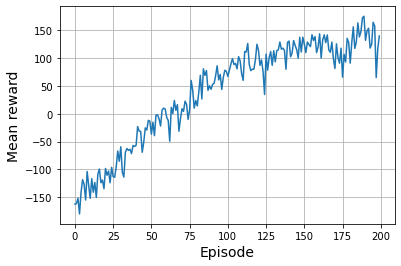

In [84]:
plt.plot(mean_rewards)
plt.xlabel("Episode")
plt.ylabel("Mean reward")
plt.grid()
plt.show()

Now let's look at the result!

In [85]:
def lander_render_policy_net(model, n_max_steps=500, seed=42):
    frames = []
    env = gym.make("LunarLander-v2", render_mode="rgb_array")
    tf.random.set_seed(seed)
    np.random.seed(seed)
    obs, info = env.reset(seed=seed)
    for step in range(n_max_steps):
        frames.append(env.render())
        probas = model(obs[np.newaxis])
        logits = tf.math.log(probas + tf.keras.backend.epsilon())
        action = tf.random.categorical(logits, num_samples=1)
        obs, reward, done, truncated, info = env.step(action[0, 0].numpy())
        if done or truncated:
            break
    env.close()
    return frames

In [86]:
frames = lander_render_policy_net(model, seed=42)
plot_animation(frames)

That's pretty good. You can try training it for longer and/or tweaking the hyperparameters to see if you can get it to go over 200.

## 9.
_Exercise: Use a Double Dueling DQN to train an agent that can achieve a superhuman level at the famous Atari Breakout game (`"ALE/Breakout-v5"`). The observations are images. To simplify the task, you should convert them to grayscale (i.e., average over the channels axis), crop them and downsample them, so they're just large enough to play, but not much more. An individual image does not tell you which way the ball and the paddles are going, so you should merge two or three consecutive images to form each state. Lastly, the DQN should be composed mostly of convolutional layers._

TODO

Check out the [State-of-the-Art for Atari Games on paperswithcode.com](https://paperswithcode.com/task/atari-games).

## 10.
_Exercise: If you have about $100 to spare, you can purchase a Raspberry Pi 3 plus some cheap robotics components, install TensorFlow on the Pi, and go wild! For an example, check out this [fun post](https://homl.info/2) by Lukas Biewald, or take a look at GoPiGo or BrickPi. Start with simple goals, like making the robot turn around to find the brightest angle (if it has a light sensor) or the closest object (if it has a sonar sensor), and move in that direction. Then you can start using Deep Learning: for example, if the robot has a camera, you can try to implement an object detection algorithm so it detects people and moves toward them. You can also try to use RL to make the agent learn on its own how to use the motors to achieve that goal. Have fun!_

It's your turn now: go crazy, be creative, but most of all, be patient and move forward step by step, you can do it!